# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(8 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v4"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1744,1576,1379,1761,1434,1554,1401,1000
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1508,3595,2219,2783,1744
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 411,385,413,410,356,386,366,235
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 431,873,541,706,411
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:17<2:57:59, 17.83s/it]

Epoch 1/600:   0%|          | 1/600 [00:17<2:57:59, 17.83s/it, v_num=1, total_loss_train=2.68e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 1/600 [00:17<2:57:59, 17.83s/it, v_num=1, total_loss_train=2.68e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 2/600 [00:32<2:37:48, 15.83s/it, v_num=1, total_loss_train=2.68e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 2/600 [00:32<2:37:48, 15.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=44.1]

Epoch 3/600:   0%|          | 2/600 [00:32<2:37:48, 15.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=44.1]

Epoch 3/600:   0%|          | 3/600 [00:46<2:32:17, 15.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=44.1]

Epoch 3/600:   0%|          | 3/600 [00:46<2:32:17, 15.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48]   

Epoch 4/600:   0%|          | 3/600 [00:46<2:32:17, 15.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48]

Epoch 4/600:   1%|          | 4/600 [01:01<2:29:47, 15.08s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48]

Epoch 4/600:   1%|          | 4/600 [01:01<2:29:47, 15.08s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.9]

Epoch 5/600:   1%|          | 4/600 [01:01<2:29:47, 15.08s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.9]

Epoch 5/600:   1%|          | 5/600 [01:17<2:32:51, 15.41s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.9]

Epoch 5/600:   1%|          | 5/600 [01:17<2:32:51, 15.41s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.8]

Epoch 6/600:   1%|          | 5/600 [01:18<2:32:51, 15.41s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.8]

Epoch 6/600:   1%|          | 6/600 [01:31<2:28:33, 15.01s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=48.8]

Epoch 6/600:   1%|          | 6/600 [01:31<2:28:33, 15.01s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=47.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 7/600:   1%|          | 6/600 [01:31<2:28:33, 15.01s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=47.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 7/600:   1%|          | 7/600 [01:45<2:23:56, 14.56s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=47.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 7/600:   1%|          | 7/600 [01:45<2:23:56, 14.56s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=45.1, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 8/600:   1%|          | 7/600 [01:45<2:23:56, 14.56s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=45.1, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 8/600:   1%|▏         | 8/600 [01:59<2:22:10, 14.41s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=45.1, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 8/600:   1%|▏         | 8/600 [01:59<2:22:10, 14.41s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=49.7, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287] 

Epoch 9/600:   1%|▏         | 8/600 [01:59<2:22:10, 14.41s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=49.7, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 9/600:   2%|▏         | 9/600 [02:13<2:18:53, 14.10s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=49.7, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 9/600:   2%|▏         | 9/600 [02:13<2:18:53, 14.10s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.9, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 10/600:   2%|▏         | 9/600 [02:13<2:18:53, 14.10s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.9, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 10/600:   2%|▏         | 10/600 [02:26<2:17:39, 14.00s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.9, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 10/600:   2%|▏         | 10/600 [02:26<2:17:39, 14.00s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=41.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 11/600:   2%|▏         | 10/600 [02:27<2:17:39, 14.00s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=41.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:16:57, 13.95s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=41.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0287]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:16:57, 13.95s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=33.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 12/600:   2%|▏         | 11/600 [02:40<2:16:57, 13.95s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=33.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:16:54, 13.97s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=33.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:16:54, 13.97s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=26.1, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 13/600:   2%|▏         | 12/600 [02:54<2:16:54, 13.97s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=26.1, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:14:48, 13.78s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=26.1, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:14:48, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=25.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308] 

Epoch 14/600:   2%|▏         | 13/600 [03:08<2:14:48, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=25.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 14/600:   2%|▏         | 14/600 [03:21<2:13:07, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=25.9, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 14/600:   2%|▏         | 14/600 [03:21<2:13:07, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=28.8, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 15/600:   2%|▏         | 14/600 [03:21<2:13:07, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=28.8, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 15/600:   2%|▎         | 15/600 [03:35<2:13:33, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=28.8, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 15/600:   2%|▎         | 15/600 [03:35<2:13:33, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=33, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308] 

Epoch 16/600:   2%|▎         | 15/600 [03:35<2:13:33, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=33, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 16/600:   3%|▎         | 16/600 [03:49<2:13:56, 13.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=33, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0308]

Epoch 16/600:   3%|▎         | 16/600 [03:49<2:13:56, 13.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=37.8, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 17/600:   3%|▎         | 16/600 [03:49<2:13:56, 13.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=37.8, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 17/600:   3%|▎         | 17/600 [04:02<2:12:31, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=37.8, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 17/600:   3%|▎         | 17/600 [04:02<2:12:31, 13.64s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 18/600:   3%|▎         | 17/600 [04:02<2:12:31, 13.64s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 18/600:   3%|▎         | 18/600 [04:15<2:12:06, 13.62s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 18/600:   3%|▎         | 18/600 [04:15<2:12:06, 13.62s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=49, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]  

Epoch 19/600:   3%|▎         | 18/600 [04:16<2:12:06, 13.62s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=49, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 19/600:   3%|▎         | 19/600 [04:29<2:11:26, 13.57s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=49, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 19/600:   3%|▎         | 19/600 [04:29<2:11:26, 13.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=56.5, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 20/600:   3%|▎         | 19/600 [04:29<2:11:26, 13.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=56.5, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 20/600:   3%|▎         | 20/600 [04:43<2:12:04, 13.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=56.5, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 20/600:   3%|▎         | 20/600 [04:43<2:12:04, 13.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 21/600:   3%|▎         | 20/600 [04:43<2:12:04, 13.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 21/600:   4%|▎         | 21/600 [04:57<2:12:09, 13.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.0475, metric_mi|condition_train=0.103]

Epoch 21/600:   4%|▎         | 21/600 [04:57<2:12:09, 13.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 22/600:   4%|▎         | 21/600 [04:57<2:12:09, 13.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 22/600:   4%|▎         | 22/600 [05:10<2:12:18, 13.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 22/600:   4%|▎         | 22/600 [05:10<2:12:18, 13.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 23/600:   4%|▎         | 22/600 [05:10<2:12:18, 13.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 23/600:   4%|▍         | 23/600 [05:24<2:11:10, 13.64s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 23/600:   4%|▍         | 23/600 [05:24<2:11:10, 13.64s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 24/600:   4%|▍         | 23/600 [05:24<2:11:10, 13.64s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 24/600:   4%|▍         | 24/600 [05:37<2:09:55, 13.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 24/600:   4%|▍         | 24/600 [05:37<2:09:55, 13.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 25/600:   4%|▍         | 24/600 [05:37<2:09:55, 13.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 25/600:   4%|▍         | 25/600 [05:51<2:09:47, 13.54s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 25/600:   4%|▍         | 25/600 [05:51<2:09:47, 13.54s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 26/600:   4%|▍         | 25/600 [05:51<2:09:47, 13.54s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 26/600:   4%|▍         | 26/600 [06:05<2:10:17, 13.62s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.0572, metric_mi|condition_train=0.152]

Epoch 26/600:   4%|▍         | 26/600 [06:05<2:10:17, 13.62s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 27/600:   4%|▍         | 26/600 [06:05<2:10:17, 13.62s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 27/600:   4%|▍         | 27/600 [06:18<2:10:19, 13.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 27/600:   4%|▍         | 27/600 [06:18<2:10:19, 13.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 28/600:   4%|▍         | 27/600 [06:18<2:10:19, 13.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 28/600:   5%|▍         | 28/600 [06:32<2:09:16, 13.56s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 28/600:   5%|▍         | 28/600 [06:32<2:09:16, 13.56s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 29/600:   5%|▍         | 28/600 [06:32<2:09:16, 13.56s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 29/600:   5%|▍         | 29/600 [06:45<2:08:49, 13.54s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 29/600:   5%|▍         | 29/600 [06:45<2:08:49, 13.54s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 30/600:   5%|▍         | 29/600 [06:45<2:08:49, 13.54s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 30/600:   5%|▌         | 30/600 [06:59<2:08:57, 13.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 30/600:   5%|▌         | 30/600 [06:59<2:08:57, 13.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184] 

Epoch 31/600:   5%|▌         | 30/600 [06:59<2:08:57, 13.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 31/600:   5%|▌         | 31/600 [07:12<2:08:55, 13.59s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.184]

Epoch 31/600:   5%|▌         | 31/600 [07:12<2:08:55, 13.59s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231] 

Epoch 32/600:   5%|▌         | 31/600 [07:12<2:08:55, 13.59s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 32/600:   5%|▌         | 32/600 [07:26<2:07:36, 13.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 32/600:   5%|▌         | 32/600 [07:26<2:07:36, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=119, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 33/600:   5%|▌         | 32/600 [07:26<2:07:36, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=119, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 33/600:   6%|▌         | 33/600 [07:39<2:08:39, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=119, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 33/600:   6%|▌         | 33/600 [07:40<2:08:39, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=129, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 34/600:   6%|▌         | 33/600 [07:40<2:08:39, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=129, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 34/600:   6%|▌         | 34/600 [07:53<2:07:10, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=129, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 34/600:   6%|▌         | 34/600 [07:53<2:07:10, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=134, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 35/600:   6%|▌         | 34/600 [07:53<2:07:10, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=134, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 35/600:   6%|▌         | 35/600 [08:06<2:06:48, 13.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=134, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 35/600:   6%|▌         | 35/600 [08:06<2:06:48, 13.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=148, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 36/600:   6%|▌         | 35/600 [08:06<2:06:48, 13.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=148, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 36/600:   6%|▌         | 36/600 [08:20<2:07:05, 13.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=148, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.231]

Epoch 36/600:   6%|▌         | 36/600 [08:20<2:07:05, 13.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=160, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 37/600:   6%|▌         | 36/600 [08:20<2:07:05, 13.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=160, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 37/600:   6%|▌         | 37/600 [08:34<2:07:56, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=160, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 37/600:   6%|▌         | 37/600 [08:34<2:07:56, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=167, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 38/600:   6%|▌         | 37/600 [08:34<2:07:56, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=167, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 38/600:   6%|▋         | 38/600 [08:47<2:05:42, 13.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=167, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 38/600:   6%|▋         | 38/600 [08:47<2:05:42, 13.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=173, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 39/600:   6%|▋         | 38/600 [08:47<2:05:42, 13.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=173, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 39/600:   6%|▋         | 39/600 [08:58<2:00:49, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=173, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 39/600:   6%|▋         | 39/600 [08:58<2:00:49, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 40/600:   6%|▋         | 39/600 [08:58<2:00:49, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 40/600:   7%|▋         | 40/600 [09:10<1:57:27, 12.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 40/600:   7%|▋         | 40/600 [09:10<1:57:27, 12.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=185, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 41/600:   7%|▋         | 40/600 [09:10<1:57:27, 12.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=185, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 41/600:   7%|▋         | 41/600 [09:22<1:55:43, 12.42s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=185, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.287]

Epoch 41/600:   7%|▋         | 41/600 [09:22<1:55:43, 12.42s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=187, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 42/600:   7%|▋         | 41/600 [09:22<1:55:43, 12.42s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=187, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 42/600:   7%|▋         | 42/600 [09:34<1:53:39, 12.22s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=187, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 42/600:   7%|▋         | 42/600 [09:34<1:53:39, 12.22s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=197, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 43/600:   7%|▋         | 42/600 [09:34<1:53:39, 12.22s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=197, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 43/600:   7%|▋         | 43/600 [09:46<1:52:21, 12.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=197, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 43/600:   7%|▋         | 43/600 [09:46<1:52:21, 12.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=203, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 44/600:   7%|▋         | 43/600 [09:46<1:52:21, 12.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=203, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 44/600:   7%|▋         | 44/600 [09:58<1:51:17, 12.01s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=203, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 44/600:   7%|▋         | 44/600 [09:58<1:51:17, 12.01s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=204, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 45/600:   7%|▋         | 44/600 [09:58<1:51:17, 12.01s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=204, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 45/600:   8%|▊         | 45/600 [10:10<1:51:29, 12.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=204, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 45/600:   8%|▊         | 45/600 [10:10<1:51:29, 12.05s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=214, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 46/600:   8%|▊         | 45/600 [10:10<1:51:29, 12.05s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=214, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 46/600:   8%|▊         | 46/600 [10:22<1:51:40, 12.09s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=214, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.331]

Epoch 46/600:   8%|▊         | 46/600 [10:22<1:51:40, 12.09s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=219, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35] 

Epoch 47/600:   8%|▊         | 46/600 [10:22<1:51:40, 12.09s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=219, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 47/600:   8%|▊         | 47/600 [10:34<1:50:11, 11.95s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=219, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 47/600:   8%|▊         | 47/600 [10:34<1:50:11, 11.95s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=226, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 48/600:   8%|▊         | 47/600 [10:34<1:50:11, 11.95s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=226, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 48/600:   8%|▊         | 48/600 [10:46<1:52:34, 12.24s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=226, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 48/600:   8%|▊         | 48/600 [10:46<1:52:34, 12.24s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=230, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 49/600:   8%|▊         | 48/600 [10:46<1:52:34, 12.24s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=230, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 49/600:   8%|▊         | 49/600 [10:59<1:54:07, 12.43s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=230, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 49/600:   8%|▊         | 49/600 [10:59<1:54:07, 12.43s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 50/600:   8%|▊         | 49/600 [10:59<1:54:07, 12.43s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 50/600:   8%|▊         | 50/600 [11:13<1:57:06, 12.78s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 50/600:   8%|▊         | 50/600 [11:13<1:57:06, 12.78s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 51/600:   8%|▊         | 50/600 [11:13<1:57:06, 12.78s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 51/600:   8%|▊         | 51/600 [11:26<1:58:10, 12.92s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.35]

Epoch 51/600:   8%|▊         | 51/600 [11:26<1:58:10, 12.92s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 52/600:   8%|▊         | 51/600 [11:26<1:58:10, 12.92s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 52/600:   9%|▊         | 52/600 [11:39<1:57:54, 12.91s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=233, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 52/600:   9%|▊         | 52/600 [11:39<1:57:54, 12.91s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=234, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 53/600:   9%|▊         | 52/600 [11:39<1:57:54, 12.91s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=234, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 53/600:   9%|▉         | 53/600 [11:54<2:02:08, 13.40s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=234, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 53/600:   9%|▉         | 53/600 [11:54<2:02:08, 13.40s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 54/600:   9%|▉         | 53/600 [11:54<2:02:08, 13.40s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 54/600:   9%|▉         | 54/600 [12:08<2:05:59, 13.85s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 54/600:   9%|▉         | 54/600 [12:08<2:05:59, 13.85s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 55/600:   9%|▉         | 54/600 [12:08<2:05:59, 13.85s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 55/600:   9%|▉         | 55/600 [12:23<2:08:18, 14.13s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=238, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 55/600:   9%|▉         | 55/600 [12:23<2:08:18, 14.13s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=241, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 56/600:   9%|▉         | 55/600 [12:24<2:08:18, 14.13s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=241, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 56/600:   9%|▉         | 56/600 [12:39<2:12:17, 14.59s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=241, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.368]

Epoch 56/600:   9%|▉         | 56/600 [12:39<2:12:17, 14.59s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=237, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 57/600:   9%|▉         | 56/600 [12:39<2:12:17, 14.59s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=237, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 57/600:  10%|▉         | 57/600 [12:54<2:13:11, 14.72s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=237, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 57/600:  10%|▉         | 57/600 [12:54<2:13:11, 14.72s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=232, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 58/600:  10%|▉         | 57/600 [12:54<2:13:11, 14.72s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=232, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 58/600:  10%|▉         | 58/600 [13:09<2:13:01, 14.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=232, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 58/600:  10%|▉         | 58/600 [13:09<2:13:01, 14.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 59/600:  10%|▉         | 58/600 [13:09<2:13:01, 14.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 59/600:  10%|▉         | 59/600 [13:24<2:13:14, 14.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 59/600:  10%|▉         | 59/600 [13:24<2:13:14, 14.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 60/600:  10%|▉         | 59/600 [13:24<2:13:14, 14.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 60/600:  10%|█         | 60/600 [13:39<2:13:28, 14.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=234, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 60/600:  10%|█         | 60/600 [13:39<2:13:28, 14.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=229, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 61/600:  10%|█         | 60/600 [13:39<2:13:28, 14.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=229, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 61/600:  10%|█         | 61/600 [13:53<2:12:31, 14.75s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=229, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.372]

Epoch 61/600:  10%|█         | 61/600 [13:53<2:12:31, 14.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=232, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 62/600:  10%|█         | 61/600 [13:53<2:12:31, 14.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=232, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 62/600:  10%|█         | 62/600 [14:08<2:12:02, 14.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=232, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 62/600:  10%|█         | 62/600 [14:08<2:12:02, 14.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 63/600:  10%|█         | 62/600 [14:08<2:12:02, 14.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 63/600:  10%|█         | 63/600 [14:22<2:09:36, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 63/600:  10%|█         | 63/600 [14:22<2:09:36, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 64/600:  10%|█         | 63/600 [14:22<2:09:36, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 64/600:  11%|█         | 64/600 [14:36<2:08:22, 14.37s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 64/600:  11%|█         | 64/600 [14:36<2:08:22, 14.37s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 65/600:  11%|█         | 64/600 [14:36<2:08:22, 14.37s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 65/600:  11%|█         | 65/600 [14:51<2:09:39, 14.54s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 65/600:  11%|█         | 65/600 [14:51<2:09:39, 14.54s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=226, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 66/600:  11%|█         | 65/600 [14:51<2:09:39, 14.54s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=226, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 66/600:  11%|█         | 66/600 [15:05<2:09:10, 14.51s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=226, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.379]

Epoch 66/600:  11%|█         | 66/600 [15:05<2:09:10, 14.51s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=227, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 67/600:  11%|█         | 66/600 [15:05<2:09:10, 14.51s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=227, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 67/600:  11%|█         | 67/600 [15:19<2:08:13, 14.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=227, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 67/600:  11%|█         | 67/600 [15:19<2:08:13, 14.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=222, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 68/600:  11%|█         | 67/600 [15:19<2:08:13, 14.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=222, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 68/600:  11%|█▏        | 68/600 [15:34<2:08:18, 14.47s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=222, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 68/600:  11%|█▏        | 68/600 [15:34<2:08:18, 14.47s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=214, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 69/600:  11%|█▏        | 68/600 [15:34<2:08:18, 14.47s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=214, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 69/600:  12%|█▏        | 69/600 [15:48<2:06:39, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=214, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 69/600:  12%|█▏        | 69/600 [15:48<2:06:39, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 70/600:  12%|█▏        | 69/600 [15:48<2:06:39, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 70/600:  12%|█▏        | 70/600 [16:02<2:06:22, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 70/600:  12%|█▏        | 70/600 [16:02<2:06:22, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 71/600:  12%|█▏        | 70/600 [16:03<2:06:22, 14.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 71/600:  12%|█▏        | 71/600 [16:17<2:07:38, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.354, metric_mi|condition_train=0.383]

Epoch 71/600:  12%|█▏        | 71/600 [16:17<2:07:38, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=210, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 72/600:  12%|█▏        | 71/600 [16:17<2:07:38, 14.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=210, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 72/600:  12%|█▏        | 72/600 [16:31<2:07:08, 14.45s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=210, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 72/600:  12%|█▏        | 72/600 [16:31<2:07:08, 14.45s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 73/600:  12%|█▏        | 72/600 [16:31<2:07:08, 14.45s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 73/600:  12%|█▏        | 73/600 [16:46<2:06:05, 14.35s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=216, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 73/600:  12%|█▏        | 73/600 [16:46<2:06:05, 14.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 74/600:  12%|█▏        | 73/600 [16:46<2:06:05, 14.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 74/600:  12%|█▏        | 74/600 [17:00<2:05:05, 14.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 74/600:  12%|█▏        | 74/600 [17:00<2:05:05, 14.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 75/600:  12%|█▏        | 74/600 [17:00<2:05:05, 14.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 75/600:  12%|█▎        | 75/600 [17:15<2:06:31, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 75/600:  12%|█▎        | 75/600 [17:15<2:06:31, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 76/600:  12%|█▎        | 75/600 [17:15<2:06:31, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 76/600:  13%|█▎        | 76/600 [17:29<2:06:35, 14.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.381]

Epoch 76/600:  13%|█▎        | 76/600 [17:29<2:06:35, 14.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 77/600:  13%|█▎        | 76/600 [17:29<2:06:35, 14.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 77/600:  13%|█▎        | 77/600 [17:43<2:05:21, 14.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 77/600:  13%|█▎        | 77/600 [17:43<2:05:21, 14.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 78/600:  13%|█▎        | 77/600 [17:43<2:05:21, 14.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 78/600:  13%|█▎        | 78/600 [17:58<2:05:10, 14.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 78/600:  13%|█▎        | 78/600 [17:58<2:05:10, 14.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 79/600:  13%|█▎        | 78/600 [17:58<2:05:10, 14.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 79/600:  13%|█▎        | 79/600 [18:12<2:04:43, 14.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 79/600:  13%|█▎        | 79/600 [18:12<2:04:43, 14.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 80/600:  13%|█▎        | 79/600 [18:12<2:04:43, 14.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 80/600:  13%|█▎        | 80/600 [18:26<2:04:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 80/600:  13%|█▎        | 80/600 [18:26<2:04:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 81/600:  13%|█▎        | 80/600 [18:27<2:04:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 81/600:  14%|█▎        | 81/600 [18:41<2:05:05, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.357, metric_mi|condition_train=0.378]

Epoch 81/600:  14%|█▎        | 81/600 [18:41<2:05:05, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37] 

Epoch 82/600:  14%|█▎        | 81/600 [18:41<2:05:05, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 82/600:  14%|█▎        | 82/600 [18:55<2:04:57, 14.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 82/600:  14%|█▎        | 82/600 [18:55<2:04:57, 14.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 83/600:  14%|█▎        | 82/600 [18:56<2:04:57, 14.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 83/600:  14%|█▍        | 83/600 [19:10<2:04:35, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 83/600:  14%|█▍        | 83/600 [19:10<2:04:35, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 84/600:  14%|█▍        | 83/600 [19:10<2:04:35, 14.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 84/600:  14%|█▍        | 84/600 [19:24<2:03:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 84/600:  14%|█▍        | 84/600 [19:24<2:03:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 85/600:  14%|█▍        | 84/600 [19:24<2:03:18, 14.34s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 85/600:  14%|█▍        | 85/600 [19:38<2:02:52, 14.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 85/600:  14%|█▍        | 85/600 [19:38<2:02:52, 14.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 86/600:  14%|█▍        | 85/600 [19:39<2:02:52, 14.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 86/600:  14%|█▍        | 86/600 [19:54<2:06:49, 14.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.353, metric_mi|condition_train=0.37]

Epoch 86/600:  14%|█▍        | 86/600 [19:54<2:06:49, 14.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=187, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 87/600:  14%|█▍        | 86/600 [19:54<2:06:49, 14.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=187, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 87/600:  14%|█▍        | 87/600 [20:08<2:04:43, 14.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=187, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 87/600:  14%|█▍        | 87/600 [20:08<2:04:43, 14.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=189, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 88/600:  14%|█▍        | 87/600 [20:08<2:04:43, 14.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=189, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 88/600:  15%|█▍        | 88/600 [20:23<2:05:29, 14.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=189, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 88/600:  15%|█▍        | 88/600 [20:23<2:05:29, 14.71s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 89/600:  15%|█▍        | 88/600 [20:23<2:05:29, 14.71s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 89/600:  15%|█▍        | 89/600 [20:37<2:03:25, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 89/600:  15%|█▍        | 89/600 [20:37<2:03:25, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 90/600:  15%|█▍        | 89/600 [20:37<2:03:25, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 90/600:  15%|█▌        | 90/600 [20:52<2:03:09, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=186, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 90/600:  15%|█▌        | 90/600 [20:52<2:03:09, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=184, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 91/600:  15%|█▌        | 90/600 [20:52<2:03:09, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=184, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 91/600:  15%|█▌        | 91/600 [21:07<2:03:46, 14.59s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=184, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.367]

Epoch 91/600:  15%|█▌        | 91/600 [21:07<2:03:46, 14.59s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 92/600:  15%|█▌        | 91/600 [21:07<2:03:46, 14.59s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 92/600:  15%|█▌        | 92/600 [21:21<2:02:38, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 92/600:  15%|█▌        | 92/600 [21:21<2:02:38, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 93/600:  15%|█▌        | 92/600 [21:21<2:02:38, 14.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 93/600:  16%|█▌        | 93/600 [21:35<2:01:41, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 93/600:  16%|█▌        | 93/600 [21:35<2:01:41, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 94/600:  16%|█▌        | 93/600 [21:35<2:01:41, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 94/600:  16%|█▌        | 94/600 [21:49<2:00:33, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 94/600:  16%|█▌        | 94/600 [21:49<2:00:33, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 95/600:  16%|█▌        | 94/600 [21:49<2:00:33, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 95/600:  16%|█▌        | 95/600 [22:03<2:00:30, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 95/600:  16%|█▌        | 95/600 [22:03<2:00:30, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 96/600:  16%|█▌        | 95/600 [22:04<2:00:30, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 96/600:  16%|█▌        | 96/600 [22:18<2:02:02, 14.53s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.334, metric_mi|condition_train=0.363]

Epoch 96/600:  16%|█▌        | 96/600 [22:18<2:02:02, 14.53s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=168, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]  

Epoch 97/600:  16%|█▌        | 96/600 [22:18<2:02:02, 14.53s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=168, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 97/600:  16%|█▌        | 97/600 [22:32<2:00:32, 14.38s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=168, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 97/600:  16%|█▌        | 97/600 [22:32<2:00:32, 14.38s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 98/600:  16%|█▌        | 97/600 [22:32<2:00:32, 14.38s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 98/600:  16%|█▋        | 98/600 [22:47<1:59:40, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 98/600:  16%|█▋        | 98/600 [22:47<1:59:40, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 99/600:  16%|█▋        | 98/600 [22:47<1:59:40, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 99/600:  16%|█▋        | 99/600 [23:01<1:59:31, 14.31s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 99/600:  16%|█▋        | 99/600 [23:01<1:59:31, 14.31s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 100/600:  16%|█▋        | 99/600 [23:01<1:59:31, 14.31s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 100/600:  17%|█▋        | 100/600 [23:15<1:59:38, 14.36s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 100/600:  17%|█▋        | 100/600 [23:15<1:59:38, 14.36s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 101/600:  17%|█▋        | 100/600 [23:16<1:59:38, 14.36s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 101/600:  17%|█▋        | 101/600 [23:30<1:59:46, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.36]

Epoch 101/600:  17%|█▋        | 101/600 [23:30<1:59:46, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=167, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 102/600:  17%|█▋        | 101/600 [23:30<1:59:46, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=167, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 102/600:  17%|█▋        | 102/600 [23:44<1:58:43, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=167, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 102/600:  17%|█▋        | 102/600 [23:44<1:58:43, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 103/600:  17%|█▋        | 102/600 [23:44<1:58:43, 14.30s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 103/600:  17%|█▋        | 103/600 [23:58<1:58:59, 14.37s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 103/600:  17%|█▋        | 103/600 [23:58<1:58:59, 14.37s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 104/600:  17%|█▋        | 103/600 [23:58<1:58:59, 14.37s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 104/600:  17%|█▋        | 104/600 [24:13<1:58:21, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 104/600:  17%|█▋        | 104/600 [24:13<1:58:21, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 105/600:  17%|█▋        | 104/600 [24:13<1:58:21, 14.32s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 105/600:  18%|█▊        | 105/600 [24:27<1:57:53, 14.29s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 105/600:  18%|█▊        | 105/600 [24:27<1:57:53, 14.29s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 106/600:  18%|█▊        | 105/600 [24:28<1:57:53, 14.29s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 106/600:  18%|█▊        | 106/600 [24:42<1:59:26, 14.51s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.359]

Epoch 106/600:  18%|█▊        | 106/600 [24:42<1:59:26, 14.51s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 107/600:  18%|█▊        | 106/600 [24:42<1:59:26, 14.51s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 107/600:  18%|█▊        | 107/600 [24:56<1:58:21, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 107/600:  18%|█▊        | 107/600 [24:56<1:58:21, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 108/600:  18%|█▊        | 107/600 [24:56<1:58:21, 14.40s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 108/600:  18%|█▊        | 108/600 [25:11<1:58:22, 14.44s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=163, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 108/600:  18%|█▊        | 108/600 [25:11<1:58:22, 14.44s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=159, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 109/600:  18%|█▊        | 108/600 [25:11<1:58:22, 14.44s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=159, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 109/600:  18%|█▊        | 109/600 [25:25<1:58:28, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=159, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 109/600:  18%|█▊        | 109/600 [25:25<1:58:28, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 110/600:  18%|█▊        | 109/600 [25:25<1:58:28, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 110/600:  18%|█▊        | 110/600 [25:40<1:57:59, 14.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 110/600:  18%|█▊        | 110/600 [25:40<1:57:59, 14.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 111/600:  18%|█▊        | 110/600 [25:40<1:57:59, 14.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 111/600:  18%|█▊        | 111/600 [25:54<1:58:01, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.361]

Epoch 111/600:  18%|█▊        | 111/600 [25:54<1:58:01, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=157, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362] 

Epoch 112/600:  18%|█▊        | 111/600 [25:54<1:58:01, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=157, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 112/600:  19%|█▊        | 112/600 [26:08<1:56:56, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=157, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 112/600:  19%|█▊        | 112/600 [26:08<1:56:56, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▊        | 112/600 [26:08<1:56:56, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▉        | 113/600 [26:23<1:57:44, 14.51s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=155, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▉        | 113/600 [26:23<1:57:44, 14.51s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 113/600 [26:23<1:57:44, 14.51s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 114/600 [26:37<1:56:29, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 114/600 [26:37<1:56:29, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 114/600 [26:37<1:56:29, 14.38s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 115/600 [26:51<1:55:49, 14.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=152, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 115/600 [26:51<1:55:49, 14.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 115/600 [26:52<1:55:49, 14.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 116/600 [27:06<1:56:39, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.32, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 116/600 [27:06<1:56:39, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=151, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 117/600:  19%|█▉        | 116/600 [27:06<1:56:39, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=151, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 117/600:  20%|█▉        | 117/600 [27:20<1:55:39, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=151, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 117/600:  20%|█▉        | 117/600 [27:20<1:55:39, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 118/600:  20%|█▉        | 117/600 [27:20<1:55:39, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 118/600:  20%|█▉        | 118/600 [27:35<1:56:14, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 118/600:  20%|█▉        | 118/600 [27:35<1:56:14, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 119/600:  20%|█▉        | 118/600 [27:35<1:56:14, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 119/600:  20%|█▉        | 119/600 [27:49<1:55:55, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 119/600:  20%|█▉        | 119/600 [27:49<1:55:55, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 120/600:  20%|█▉        | 119/600 [27:49<1:55:55, 14.46s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 120/600:  20%|██        | 120/600 [28:04<1:54:55, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 120/600:  20%|██        | 120/600 [28:04<1:54:55, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 121/600:  20%|██        | 120/600 [28:04<1:54:55, 14.37s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 121/600:  20%|██        | 121/600 [28:19<1:56:48, 14.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.363]

Epoch 121/600:  20%|██        | 121/600 [28:19<1:56:48, 14.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 122/600:  20%|██        | 121/600 [28:19<1:56:48, 14.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 122/600:  20%|██        | 122/600 [28:33<1:55:47, 14.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 122/600:  20%|██        | 122/600 [28:33<1:55:47, 14.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 123/600:  20%|██        | 122/600 [28:33<1:55:47, 14.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 123/600:  20%|██        | 123/600 [28:47<1:55:10, 14.49s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=146, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 123/600:  20%|██        | 123/600 [28:47<1:55:10, 14.49s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 124/600:  20%|██        | 123/600 [28:48<1:55:10, 14.49s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 124/600:  21%|██        | 124/600 [29:02<1:55:27, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 124/600:  21%|██        | 124/600 [29:02<1:55:27, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 125/600:  21%|██        | 124/600 [29:02<1:55:27, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 125/600:  21%|██        | 125/600 [29:16<1:54:34, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 125/600:  21%|██        | 125/600 [29:16<1:54:34, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 126/600:  21%|██        | 125/600 [29:17<1:54:34, 14.47s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 126/600:  21%|██        | 126/600 [29:31<1:54:57, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.362]

Epoch 126/600:  21%|██        | 126/600 [29:31<1:54:57, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 127/600:  21%|██        | 126/600 [29:31<1:54:57, 14.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 127/600:  21%|██        | 127/600 [29:45<1:53:51, 14.44s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 127/600:  21%|██        | 127/600 [29:45<1:53:51, 14.44s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 128/600:  21%|██        | 127/600 [29:45<1:53:51, 14.44s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 128/600:  21%|██▏       | 128/600 [30:00<1:53:54, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 128/600:  21%|██▏       | 128/600 [30:00<1:53:54, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 129/600:  21%|██▏       | 128/600 [30:00<1:53:54, 14.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 129/600:  22%|██▏       | 129/600 [30:15<1:54:23, 14.57s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 129/600:  22%|██▏       | 129/600 [30:15<1:54:23, 14.57s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 130/600:  22%|██▏       | 129/600 [30:15<1:54:23, 14.57s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 130/600:  22%|██▏       | 130/600 [30:30<1:54:32, 14.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 130/600:  22%|██▏       | 130/600 [30:30<1:54:32, 14.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 131/600:  22%|██▏       | 130/600 [30:30<1:54:32, 14.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 131/600:  22%|██▏       | 131/600 [30:46<1:57:35, 15.04s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.362]

Epoch 131/600:  22%|██▏       | 131/600 [30:46<1:57:35, 15.04s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 132/600:  22%|██▏       | 131/600 [30:46<1:57:35, 15.04s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 132/600:  22%|██▏       | 132/600 [31:01<1:57:49, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 132/600:  22%|██▏       | 132/600 [31:01<1:57:49, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 133/600:  22%|██▏       | 132/600 [31:01<1:57:49, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 133/600:  22%|██▏       | 133/600 [31:16<1:57:36, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 133/600:  22%|██▏       | 133/600 [31:16<1:57:36, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 134/600:  22%|██▏       | 133/600 [31:16<1:57:36, 15.11s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 134/600:  22%|██▏       | 134/600 [31:30<1:54:41, 14.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 134/600:  22%|██▏       | 134/600 [31:30<1:54:41, 14.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 135/600:  22%|██▏       | 134/600 [31:30<1:54:41, 14.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 135/600:  22%|██▎       | 135/600 [31:43<1:50:25, 14.25s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 135/600:  22%|██▎       | 135/600 [31:43<1:50:25, 14.25s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 136/600:  22%|██▎       | 135/600 [31:43<1:50:25, 14.25s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 136/600:  23%|██▎       | 136/600 [31:56<1:47:59, 13.96s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.314, metric_mi|condition_train=0.356]

Epoch 136/600:  23%|██▎       | 136/600 [31:56<1:47:59, 13.96s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 137/600:  23%|██▎       | 136/600 [31:56<1:47:59, 13.96s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 137/600:  23%|██▎       | 137/600 [32:09<1:45:34, 13.68s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 137/600:  23%|██▎       | 137/600 [32:09<1:45:34, 13.68s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 138/600:  23%|██▎       | 137/600 [32:09<1:45:34, 13.68s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 138/600:  23%|██▎       | 138/600 [32:23<1:44:56, 13.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 138/600:  23%|██▎       | 138/600 [32:23<1:44:56, 13.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 139/600:  23%|██▎       | 138/600 [32:23<1:44:56, 13.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 139/600:  23%|██▎       | 139/600 [32:36<1:43:33, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 139/600:  23%|██▎       | 139/600 [32:36<1:43:33, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 140/600:  23%|██▎       | 139/600 [32:36<1:43:33, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 140/600:  23%|██▎       | 140/600 [32:49<1:42:58, 13.43s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 140/600:  23%|██▎       | 140/600 [32:49<1:42:58, 13.43s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 141/600:  23%|██▎       | 140/600 [32:50<1:42:58, 13.43s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 141/600:  24%|██▎       | 141/600 [33:02<1:41:56, 13.32s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.355]

Epoch 141/600:  24%|██▎       | 141/600 [33:02<1:41:56, 13.32s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 142/600:  24%|██▎       | 141/600 [33:02<1:41:56, 13.32s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 142/600:  24%|██▎       | 142/600 [33:16<1:41:57, 13.36s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 142/600:  24%|██▎       | 142/600 [33:16<1:41:57, 13.36s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 143/600:  24%|██▎       | 142/600 [33:16<1:41:57, 13.36s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 143/600:  24%|██▍       | 143/600 [33:29<1:42:24, 13.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 143/600:  24%|██▍       | 143/600 [33:29<1:42:24, 13.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 144/600:  24%|██▍       | 143/600 [33:29<1:42:24, 13.45s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 144/600:  24%|██▍       | 144/600 [33:43<1:42:47, 13.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 144/600:  24%|██▍       | 144/600 [33:43<1:42:47, 13.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 145/600:  24%|██▍       | 144/600 [33:43<1:42:47, 13.53s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 145/600:  24%|██▍       | 145/600 [33:57<1:43:04, 13.59s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 145/600:  24%|██▍       | 145/600 [33:57<1:43:04, 13.59s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 146/600:  24%|██▍       | 145/600 [33:57<1:43:04, 13.59s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 146/600:  24%|██▍       | 146/600 [34:11<1:43:27, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.356]

Epoch 146/600:  24%|██▍       | 146/600 [34:11<1:43:27, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 147/600:  24%|██▍       | 146/600 [34:11<1:43:27, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 147/600:  24%|██▍       | 147/600 [34:24<1:41:47, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 147/600:  24%|██▍       | 147/600 [34:24<1:41:47, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 148/600:  24%|██▍       | 147/600 [34:24<1:41:47, 13.48s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 148/600:  25%|██▍       | 148/600 [34:37<1:40:26, 13.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 148/600:  25%|██▍       | 148/600 [34:37<1:40:26, 13.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 149/600:  25%|██▍       | 148/600 [34:37<1:40:26, 13.33s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 149/600:  25%|██▍       | 149/600 [34:50<1:40:40, 13.39s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 149/600:  25%|██▍       | 149/600 [34:50<1:40:40, 13.39s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 150/600:  25%|██▍       | 149/600 [34:50<1:40:40, 13.39s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 150/600:  25%|██▌       | 150/600 [35:03<1:40:01, 13.34s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 150/600:  25%|██▌       | 150/600 [35:03<1:40:01, 13.34s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 151/600:  25%|██▌       | 150/600 [35:04<1:40:01, 13.34s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 151/600:  25%|██▌       | 151/600 [35:17<1:40:24, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.352]

Epoch 151/600:  25%|██▌       | 151/600 [35:17<1:40:24, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 152/600:  25%|██▌       | 151/600 [35:17<1:40:24, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 152/600:  25%|██▌       | 152/600 [35:30<1:40:12, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 152/600:  25%|██▌       | 152/600 [35:30<1:40:12, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 153/600:  25%|██▌       | 152/600 [35:30<1:40:12, 13.42s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 153/600:  26%|██▌       | 153/600 [35:44<1:40:57, 13.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 153/600:  26%|██▌       | 153/600 [35:44<1:40:57, 13.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 154/600:  26%|██▌       | 153/600 [35:44<1:40:57, 13.55s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 154/600:  26%|██▌       | 154/600 [35:58<1:40:21, 13.50s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 154/600:  26%|██▌       | 154/600 [35:58<1:40:21, 13.50s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 155/600:  26%|██▌       | 154/600 [35:58<1:40:21, 13.50s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 155/600:  26%|██▌       | 155/600 [36:12<1:40:59, 13.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 155/600:  26%|██▌       | 155/600 [36:12<1:40:59, 13.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 156/600:  26%|██▌       | 155/600 [36:12<1:40:59, 13.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 156/600:  26%|██▌       | 156/600 [36:25<1:41:18, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.329, metric_mi|condition_train=0.348]

Epoch 156/600:  26%|██▌       | 156/600 [36:25<1:41:18, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347] 

Epoch 157/600:  26%|██▌       | 156/600 [36:25<1:41:18, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 157/600:  26%|██▌       | 157/600 [36:39<1:40:29, 13.61s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 157/600:  26%|██▌       | 157/600 [36:39<1:40:29, 13.61s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 158/600:  26%|██▌       | 157/600 [36:39<1:40:29, 13.61s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 158/600:  26%|██▋       | 158/600 [36:52<1:40:00, 13.58s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 158/600:  26%|██▋       | 158/600 [36:52<1:40:00, 13.58s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 159/600:  26%|██▋       | 158/600 [36:52<1:40:00, 13.58s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 159/600:  26%|██▋       | 159/600 [37:06<1:40:20, 13.65s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 159/600:  26%|██▋       | 159/600 [37:06<1:40:20, 13.65s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 160/600:  26%|██▋       | 159/600 [37:06<1:40:20, 13.65s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 160/600:  27%|██▋       | 160/600 [37:20<1:40:01, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 160/600:  27%|██▋       | 160/600 [37:20<1:40:01, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 161/600:  27%|██▋       | 160/600 [37:20<1:40:01, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 161/600:  27%|██▋       | 161/600 [37:34<1:39:57, 13.66s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.347]

Epoch 161/600:  27%|██▋       | 161/600 [37:34<1:39:57, 13.66s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 162/600:  27%|██▋       | 161/600 [37:34<1:39:57, 13.66s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 162/600:  27%|██▋       | 162/600 [37:47<1:39:15, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 162/600:  27%|██▋       | 162/600 [37:47<1:39:15, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 163/600:  27%|██▋       | 162/600 [37:47<1:39:15, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 163/600:  27%|██▋       | 163/600 [38:00<1:38:29, 13.52s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 163/600:  27%|██▋       | 163/600 [38:00<1:38:29, 13.52s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 164/600:  27%|██▋       | 163/600 [38:00<1:38:29, 13.52s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 164/600:  27%|██▋       | 164/600 [38:14<1:39:05, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 164/600:  27%|██▋       | 164/600 [38:14<1:39:05, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 165/600:  27%|██▋       | 164/600 [38:14<1:39:05, 13.64s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 165/600:  28%|██▊       | 165/600 [38:28<1:38:35, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 165/600:  28%|██▊       | 165/600 [38:28<1:38:35, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 166/600:  28%|██▊       | 165/600 [38:28<1:38:35, 13.60s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 166/600:  28%|██▊       | 166/600 [38:42<1:39:01, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.346]

Epoch 166/600:  28%|██▊       | 166/600 [38:42<1:39:01, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 167/600:  28%|██▊       | 166/600 [38:42<1:39:01, 13.69s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 167/600:  28%|██▊       | 167/600 [38:55<1:38:52, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 167/600:  28%|██▊       | 167/600 [38:55<1:38:52, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=122, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 168/600:  28%|██▊       | 167/600 [38:55<1:38:52, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=122, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 168/600:  28%|██▊       | 168/600 [39:09<1:39:16, 13.79s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=122, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 168/600:  28%|██▊       | 168/600 [39:09<1:39:16, 13.79s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 169/600:  28%|██▊       | 168/600 [39:09<1:39:16, 13.79s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 169/600:  28%|██▊       | 169/600 [39:23<1:38:23, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 169/600:  28%|██▊       | 169/600 [39:23<1:38:23, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 170/600:  28%|██▊       | 169/600 [39:23<1:38:23, 13.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 170/600:  28%|██▊       | 170/600 [39:36<1:37:59, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 170/600:  28%|██▊       | 170/600 [39:36<1:37:59, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 171/600:  28%|██▊       | 170/600 [39:37<1:37:59, 13.67s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 171/600:  28%|██▊       | 171/600 [39:50<1:38:25, 13.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.328, metric_mi|condition_train=0.339]

Epoch 171/600:  28%|██▊       | 171/600 [39:50<1:38:25, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333] 

Epoch 172/600:  28%|██▊       | 171/600 [39:50<1:38:25, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 172/600:  29%|██▊       | 172/600 [40:04<1:38:18, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 172/600:  29%|██▊       | 172/600 [40:04<1:38:18, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=119, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 173/600:  29%|██▊       | 172/600 [40:04<1:38:18, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=119, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 173/600:  29%|██▉       | 173/600 [40:18<1:38:06, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=119, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 173/600:  29%|██▉       | 173/600 [40:18<1:38:06, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 174/600:  29%|██▉       | 173/600 [40:18<1:38:06, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 174/600:  29%|██▉       | 174/600 [40:32<1:37:22, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 174/600:  29%|██▉       | 174/600 [40:32<1:37:22, 13.71s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 175/600:  29%|██▉       | 174/600 [40:32<1:37:22, 13.71s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 175/600:  29%|██▉       | 175/600 [40:46<1:38:06, 13.85s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 175/600:  29%|██▉       | 175/600 [40:46<1:38:06, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333] 

Epoch 176/600:  29%|██▉       | 175/600 [40:46<1:38:06, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 176/600:  29%|██▉       | 176/600 [41:00<1:37:54, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=117, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.333]

Epoch 176/600:  29%|██▉       | 176/600 [41:00<1:37:54, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=116, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 177/600:  29%|██▉       | 176/600 [41:00<1:37:54, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=116, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 177/600:  30%|██▉       | 177/600 [41:13<1:36:52, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=116, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 177/600:  30%|██▉       | 177/600 [41:13<1:36:52, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 178/600:  30%|██▉       | 177/600 [41:13<1:36:52, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 178/600:  30%|██▉       | 178/600 [41:27<1:37:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 178/600:  30%|██▉       | 178/600 [41:27<1:37:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 179/600:  30%|██▉       | 178/600 [41:27<1:37:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 179/600:  30%|██▉       | 179/600 [41:41<1:36:35, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 179/600:  30%|██▉       | 179/600 [41:41<1:36:35, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 180/600:  30%|██▉       | 179/600 [41:41<1:36:35, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 180/600:  30%|███       | 180/600 [41:54<1:36:12, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 180/600:  30%|███       | 180/600 [41:54<1:36:12, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 181/600:  30%|███       | 180/600 [41:55<1:36:12, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 181/600:  30%|███       | 181/600 [42:09<1:37:22, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.322, metric_mi|condition_train=0.329]

Epoch 181/600:  30%|███       | 181/600 [42:09<1:37:22, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 182/600:  30%|███       | 181/600 [42:09<1:37:22, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 182/600:  30%|███       | 182/600 [42:22<1:36:08, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=115, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 182/600:  30%|███       | 182/600 [42:22<1:36:08, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 183/600:  30%|███       | 182/600 [42:22<1:36:08, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 183/600:  30%|███       | 183/600 [42:36<1:35:48, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 183/600:  30%|███       | 183/600 [42:36<1:35:48, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 184/600:  30%|███       | 183/600 [42:36<1:35:48, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 184/600:  31%|███       | 184/600 [42:50<1:35:59, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 184/600:  31%|███       | 184/600 [42:50<1:35:59, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 185/600:  31%|███       | 184/600 [42:50<1:35:59, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 185/600:  31%|███       | 185/600 [43:04<1:35:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 185/600:  31%|███       | 185/600 [43:04<1:35:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 186/600:  31%|███       | 185/600 [43:04<1:35:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 186/600:  31%|███       | 186/600 [43:18<1:35:23, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=113, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.328]

Epoch 186/600:  31%|███       | 186/600 [43:18<1:35:23, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325] 

Epoch 187/600:  31%|███       | 186/600 [43:18<1:35:23, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 187/600:  31%|███       | 187/600 [43:31<1:34:26, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 187/600:  31%|███       | 187/600 [43:31<1:34:26, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 188/600:  31%|███       | 187/600 [43:31<1:34:26, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 188/600:  31%|███▏      | 188/600 [43:45<1:34:55, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 188/600:  31%|███▏      | 188/600 [43:45<1:34:55, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 189/600:  31%|███▏      | 188/600 [43:45<1:34:55, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 189/600:  32%|███▏      | 189/600 [43:59<1:33:57, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 189/600:  32%|███▏      | 189/600 [43:59<1:33:57, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 190/600:  32%|███▏      | 189/600 [43:59<1:33:57, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 190/600:  32%|███▏      | 190/600 [44:12<1:33:16, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 190/600:  32%|███▏      | 190/600 [44:12<1:33:16, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 191/600:  32%|███▏      | 190/600 [44:13<1:33:16, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 191/600:  32%|███▏      | 191/600 [44:27<1:34:54, 13.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.325]

Epoch 191/600:  32%|███▏      | 191/600 [44:27<1:34:54, 13.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 192/600:  32%|███▏      | 191/600 [44:27<1:34:54, 13.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 192/600:  32%|███▏      | 192/600 [44:40<1:33:41, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 192/600:  32%|███▏      | 192/600 [44:40<1:33:41, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 193/600:  32%|███▏      | 192/600 [44:40<1:33:41, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 193/600:  32%|███▏      | 193/600 [44:54<1:32:38, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=111, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 193/600:  32%|███▏      | 193/600 [44:54<1:32:38, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 194/600:  32%|███▏      | 193/600 [44:54<1:32:38, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 194/600:  32%|███▏      | 194/600 [45:07<1:32:37, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 194/600:  32%|███▏      | 194/600 [45:07<1:32:37, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 195/600:  32%|███▏      | 194/600 [45:07<1:32:37, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 195/600:  32%|███▎      | 195/600 [45:21<1:33:18, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 195/600:  32%|███▎      | 195/600 [45:21<1:33:18, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 196/600:  32%|███▎      | 195/600 [45:22<1:33:18, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 196/600:  33%|███▎      | 196/600 [45:35<1:33:18, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 196/600:  33%|███▎      | 196/600 [45:35<1:33:18, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 197/600:  33%|███▎      | 196/600 [45:35<1:33:18, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 197/600:  33%|███▎      | 197/600 [45:49<1:32:11, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=110, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 197/600:  33%|███▎      | 197/600 [45:49<1:32:11, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 198/600:  33%|███▎      | 197/600 [45:49<1:32:11, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 198/600:  33%|███▎      | 198/600 [46:02<1:31:22, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 198/600:  33%|███▎      | 198/600 [46:02<1:31:22, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 199/600:  33%|███▎      | 198/600 [46:02<1:31:22, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 199/600:  33%|███▎      | 199/600 [46:16<1:31:37, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 199/600:  33%|███▎      | 199/600 [46:16<1:31:37, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 200/600:  33%|███▎      | 199/600 [46:16<1:31:37, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 200/600:  33%|███▎      | 200/600 [46:30<1:31:05, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=109, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 200/600:  33%|███▎      | 200/600 [46:30<1:31:05, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 201/600:  33%|███▎      | 200/600 [46:30<1:31:05, 13.66s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 201/600:  34%|███▎      | 201/600 [46:44<1:31:24, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.323]

Epoch 201/600:  34%|███▎      | 201/600 [46:44<1:31:24, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 202/600:  34%|███▎      | 201/600 [46:44<1:31:24, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 202/600:  34%|███▎      | 202/600 [46:57<1:31:22, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 202/600:  34%|███▎      | 202/600 [46:57<1:31:22, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 203/600:  34%|███▎      | 202/600 [46:57<1:31:22, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 203/600:  34%|███▍      | 203/600 [47:11<1:30:26, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 203/600:  34%|███▍      | 203/600 [47:11<1:30:26, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 204/600:  34%|███▍      | 203/600 [47:11<1:30:26, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 204/600:  34%|███▍      | 204/600 [47:24<1:29:29, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=108, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 204/600:  34%|███▍      | 204/600 [47:24<1:29:29, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 205/600:  34%|███▍      | 204/600 [47:24<1:29:29, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 205/600:  34%|███▍      | 205/600 [47:38<1:30:10, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 205/600:  34%|███▍      | 205/600 [47:38<1:30:10, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 206/600:  34%|███▍      | 205/600 [47:39<1:30:10, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 206/600:  34%|███▍      | 206/600 [47:52<1:30:07, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.324]

Epoch 206/600:  34%|███▍      | 206/600 [47:52<1:30:07, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 207/600:  34%|███▍      | 206/600 [47:52<1:30:07, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 207/600:  34%|███▍      | 207/600 [48:05<1:29:14, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 207/600:  34%|███▍      | 207/600 [48:05<1:29:14, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 208/600:  34%|███▍      | 207/600 [48:05<1:29:14, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 208/600:  35%|███▍      | 208/600 [48:19<1:28:29, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=107, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 208/600:  35%|███▍      | 208/600 [48:19<1:28:29, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 209/600:  35%|███▍      | 208/600 [48:19<1:28:29, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 209/600:  35%|███▍      | 209/600 [48:33<1:28:57, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 209/600:  35%|███▍      | 209/600 [48:33<1:28:57, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 210/600:  35%|███▍      | 209/600 [48:33<1:28:57, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 210/600:  35%|███▌      | 210/600 [48:46<1:28:45, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 210/600:  35%|███▌      | 210/600 [48:46<1:28:45, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 211/600:  35%|███▌      | 210/600 [48:47<1:28:45, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 211/600:  35%|███▌      | 211/600 [49:00<1:28:55, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.327]

Epoch 211/600:  35%|███▌      | 211/600 [49:00<1:28:55, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 212/600:  35%|███▌      | 211/600 [49:00<1:28:55, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 212/600:  35%|███▌      | 212/600 [49:14<1:28:05, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 212/600:  35%|███▌      | 212/600 [49:14<1:28:05, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 213/600:  35%|███▌      | 212/600 [49:14<1:28:05, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 213/600:  36%|███▌      | 213/600 [49:27<1:28:11, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 213/600:  36%|███▌      | 213/600 [49:27<1:28:11, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 214/600:  36%|███▌      | 213/600 [49:27<1:28:11, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 214/600:  36%|███▌      | 214/600 [49:41<1:28:09, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 214/600:  36%|███▌      | 214/600 [49:41<1:28:09, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 215/600:  36%|███▌      | 214/600 [49:41<1:28:09, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 215/600:  36%|███▌      | 215/600 [49:55<1:27:25, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 215/600:  36%|███▌      | 215/600 [49:55<1:27:25, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 216/600:  36%|███▌      | 215/600 [49:55<1:27:25, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 216/600:  36%|███▌      | 216/600 [50:09<1:27:59, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.332]

Epoch 216/600:  36%|███▌      | 216/600 [50:09<1:27:59, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 217/600:  36%|███▌      | 216/600 [50:09<1:27:59, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 217/600:  36%|███▌      | 217/600 [50:23<1:28:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=106, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 217/600:  36%|███▌      | 217/600 [50:23<1:28:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 218/600:  36%|███▌      | 217/600 [50:23<1:28:09, 13.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 218/600:  36%|███▋      | 218/600 [50:36<1:27:13, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=105, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 218/600:  36%|███▋      | 218/600 [50:36<1:27:13, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=104, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 219/600:  36%|███▋      | 218/600 [50:36<1:27:13, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=104, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 219/600:  36%|███▋      | 219/600 [50:50<1:26:48, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=104, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 219/600:  36%|███▋      | 219/600 [50:50<1:26:48, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 220/600:  36%|███▋      | 219/600 [50:50<1:26:48, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 220/600:  37%|███▋      | 220/600 [51:03<1:26:51, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 220/600:  37%|███▋      | 220/600 [51:03<1:26:51, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 221/600:  37%|███▋      | 220/600 [51:04<1:26:51, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 221/600:  37%|███▋      | 221/600 [51:17<1:27:11, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.334]

Epoch 221/600:  37%|███▋      | 221/600 [51:17<1:27:11, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 222/600:  37%|███▋      | 221/600 [51:17<1:27:11, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 222/600:  37%|███▋      | 222/600 [51:31<1:26:12, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 222/600:  37%|███▋      | 222/600 [51:31<1:26:12, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 223/600:  37%|███▋      | 222/600 [51:31<1:26:12, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 223/600:  37%|███▋      | 223/600 [51:44<1:25:27, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 223/600:  37%|███▋      | 223/600 [51:44<1:25:27, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 224/600:  37%|███▋      | 223/600 [51:44<1:25:27, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 224/600:  37%|███▋      | 224/600 [51:58<1:25:47, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 224/600:  37%|███▋      | 224/600 [51:58<1:25:47, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 225/600:  37%|███▋      | 224/600 [51:58<1:25:47, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 225/600:  38%|███▊      | 225/600 [52:12<1:25:12, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 225/600:  38%|███▊      | 225/600 [52:12<1:25:12, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 226/600:  38%|███▊      | 225/600 [52:12<1:25:12, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 226/600:  38%|███▊      | 226/600 [52:26<1:25:39, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.332]

Epoch 226/600:  38%|███▊      | 226/600 [52:26<1:25:39, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33] 

Epoch 227/600:  38%|███▊      | 226/600 [52:26<1:25:39, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 227/600:  38%|███▊      | 227/600 [52:39<1:25:26, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 227/600:  38%|███▊      | 227/600 [52:39<1:25:26, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 228/600:  38%|███▊      | 227/600 [52:39<1:25:26, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 228/600:  38%|███▊      | 228/600 [52:53<1:24:15, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 228/600:  38%|███▊      | 228/600 [52:53<1:24:15, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 229/600:  38%|███▊      | 228/600 [52:53<1:24:15, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 229/600:  38%|███▊      | 229/600 [53:06<1:23:47, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 229/600:  38%|███▊      | 229/600 [53:06<1:23:47, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 230/600:  38%|███▊      | 229/600 [53:06<1:23:47, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 230/600:  38%|███▊      | 230/600 [53:20<1:24:18, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 230/600:  38%|███▊      | 230/600 [53:20<1:24:18, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 231/600:  38%|███▊      | 230/600 [53:20<1:24:18, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 231/600:  38%|███▊      | 231/600 [53:34<1:24:11, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=102, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.33]

Epoch 231/600:  38%|███▊      | 231/600 [53:34<1:24:11, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 232/600:  38%|███▊      | 231/600 [53:34<1:24:11, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 232/600:  39%|███▊      | 232/600 [53:47<1:23:21, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 232/600:  39%|███▊      | 232/600 [53:47<1:23:21, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 233/600:  39%|███▊      | 232/600 [53:47<1:23:21, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 233/600:  39%|███▉      | 233/600 [54:01<1:24:03, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 233/600:  39%|███▉      | 233/600 [54:01<1:24:03, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 234/600:  39%|███▉      | 233/600 [54:01<1:24:03, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 234/600:  39%|███▉      | 234/600 [54:15<1:23:04, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=101, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 234/600:  39%|███▉      | 234/600 [54:15<1:23:04, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=100, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 235/600:  39%|███▉      | 234/600 [54:15<1:23:04, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=100, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 235/600:  39%|███▉      | 235/600 [54:28<1:23:28, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=100, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 235/600:  39%|███▉      | 235/600 [54:28<1:23:28, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 236/600:  39%|███▉      | 235/600 [54:29<1:23:28, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 236/600:  39%|███▉      | 236/600 [54:41<1:21:43, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.329]

Epoch 236/600:  39%|███▉      | 236/600 [54:41<1:21:43, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 237/600:  39%|███▉      | 236/600 [54:41<1:21:43, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 237/600:  40%|███▉      | 237/600 [54:53<1:18:22, 12.96s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 237/600:  40%|███▉      | 237/600 [54:53<1:18:22, 12.96s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 238/600:  40%|███▉      | 237/600 [54:53<1:18:22, 12.96s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 238/600:  40%|███▉      | 238/600 [55:13<1:30:03, 14.93s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 238/600:  40%|███▉      | 238/600 [55:13<1:30:03, 14.93s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 239/600:  40%|███▉      | 238/600 [55:13<1:30:03, 14.93s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 239/600:  40%|███▉      | 239/600 [55:25<1:24:27, 14.04s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 239/600:  40%|███▉      | 239/600 [55:25<1:24:27, 14.04s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 240/600:  40%|███▉      | 239/600 [55:25<1:24:27, 14.04s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 240/600:  40%|████      | 240/600 [55:37<1:20:32, 13.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 240/600:  40%|████      | 240/600 [55:37<1:20:32, 13.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 241/600:  40%|████      | 240/600 [55:37<1:20:32, 13.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 241/600:  40%|████      | 241/600 [55:49<1:18:07, 13.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.327]

Epoch 241/600:  40%|████      | 241/600 [55:49<1:18:07, 13.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]  

Epoch 242/600:  40%|████      | 241/600 [55:49<1:18:07, 13.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 242/600:  40%|████      | 242/600 [56:01<1:15:44, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 242/600:  40%|████      | 242/600 [56:01<1:15:44, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 243/600:  40%|████      | 242/600 [56:01<1:15:44, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 243/600:  40%|████      | 243/600 [56:13<1:14:09, 12.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 243/600:  40%|████      | 243/600 [56:13<1:14:09, 12.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 244/600:  40%|████      | 243/600 [56:13<1:14:09, 12.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 244/600:  41%|████      | 244/600 [56:26<1:15:18, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 244/600:  41%|████      | 244/600 [56:26<1:15:18, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 245/600:  41%|████      | 244/600 [56:26<1:15:18, 12.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 245/600:  41%|████      | 245/600 [56:39<1:16:36, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 245/600:  41%|████      | 245/600 [56:39<1:16:36, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 246/600:  41%|████      | 245/600 [56:40<1:16:36, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 246/600:  41%|████      | 246/600 [56:53<1:17:40, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 246/600:  41%|████      | 246/600 [56:53<1:17:40, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 247/600:  41%|████      | 246/600 [56:53<1:17:40, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 247/600:  41%|████      | 247/600 [57:06<1:17:24, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 247/600:  41%|████      | 247/600 [57:06<1:17:24, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 248/600:  41%|████      | 247/600 [57:06<1:17:24, 13.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 248/600:  41%|████▏     | 248/600 [57:19<1:17:26, 13.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 248/600:  41%|████▏     | 248/600 [57:19<1:17:26, 13.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 249/600:  41%|████▏     | 248/600 [57:19<1:17:26, 13.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 249/600:  42%|████▏     | 249/600 [57:32<1:16:28, 13.07s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 249/600:  42%|████▏     | 249/600 [57:32<1:16:28, 13.07s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 250/600:  42%|████▏     | 249/600 [57:32<1:16:28, 13.07s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 250/600:  42%|████▏     | 250/600 [57:45<1:16:00, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 250/600:  42%|████▏     | 250/600 [57:45<1:16:00, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 251/600:  42%|████▏     | 250/600 [57:46<1:16:00, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 251/600:  42%|████▏     | 251/600 [57:58<1:16:05, 13.08s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.326]

Epoch 251/600:  42%|████▏     | 251/600 [57:58<1:16:05, 13.08s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 252/600:  42%|████▏     | 251/600 [57:58<1:16:05, 13.08s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 252/600:  42%|████▏     | 252/600 [58:11<1:15:20, 12.99s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 252/600:  42%|████▏     | 252/600 [58:11<1:15:20, 12.99s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 253/600:  42%|████▏     | 252/600 [58:11<1:15:20, 12.99s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 253/600:  42%|████▏     | 253/600 [58:24<1:15:03, 12.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 253/600:  42%|████▏     | 253/600 [58:24<1:15:03, 12.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]  

Epoch 254/600:  42%|████▏     | 253/600 [58:24<1:15:03, 12.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 254/600:  42%|████▏     | 254/600 [58:37<1:15:07, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=96, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 254/600:  42%|████▏     | 254/600 [58:37<1:15:07, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 255/600:  42%|████▏     | 254/600 [58:37<1:15:07, 13.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 255/600:  42%|████▎     | 255/600 [58:51<1:15:57, 13.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 255/600:  42%|████▎     | 255/600 [58:51<1:15:57, 13.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 256/600:  42%|████▎     | 255/600 [58:51<1:15:57, 13.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 256/600:  43%|████▎     | 256/600 [59:05<1:16:51, 13.40s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.322]

Epoch 256/600:  43%|████▎     | 256/600 [59:05<1:16:51, 13.40s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 257/600:  43%|████▎     | 256/600 [59:05<1:16:51, 13.40s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 257/600:  43%|████▎     | 257/600 [59:18<1:16:19, 13.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 257/600:  43%|████▎     | 257/600 [59:18<1:16:19, 13.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 258/600:  43%|████▎     | 257/600 [59:18<1:16:19, 13.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 258/600:  43%|████▎     | 258/600 [59:31<1:16:03, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 258/600:  43%|████▎     | 258/600 [59:31<1:16:03, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]  

Epoch 259/600:  43%|████▎     | 258/600 [59:31<1:16:03, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 259/600:  43%|████▎     | 259/600 [59:45<1:15:55, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 259/600:  43%|████▎     | 259/600 [59:45<1:15:55, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 260/600:  43%|████▎     | 259/600 [59:45<1:15:55, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 260/600:  43%|████▎     | 260/600 [59:58<1:15:42, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 260/600:  43%|████▎     | 260/600 [59:58<1:15:42, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 261/600:  43%|████▎     | 260/600 [59:58<1:15:42, 13.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 261/600:  44%|████▎     | 261/600 [1:00:12<1:15:57, 13.44s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.321]

Epoch 261/600:  44%|████▎     | 261/600 [1:00:12<1:15:57, 13.44s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 262/600:  44%|████▎     | 261/600 [1:00:12<1:15:57, 13.44s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 262/600:  44%|████▎     | 262/600 [1:00:25<1:16:22, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 262/600:  44%|████▎     | 262/600 [1:00:25<1:16:22, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 263/600:  44%|████▎     | 262/600 [1:00:25<1:16:22, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 263/600:  44%|████▍     | 263/600 [1:00:39<1:16:04, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 263/600:  44%|████▍     | 263/600 [1:00:39<1:16:04, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 264/600:  44%|████▍     | 263/600 [1:00:39<1:16:04, 13.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 264/600:  44%|████▍     | 264/600 [1:00:52<1:15:26, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 264/600:  44%|████▍     | 264/600 [1:00:52<1:15:26, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 265/600:  44%|████▍     | 264/600 [1:00:52<1:15:26, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 265/600:  44%|████▍     | 265/600 [1:01:06<1:15:10, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 265/600:  44%|████▍     | 265/600 [1:01:06<1:15:10, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 266/600:  44%|████▍     | 265/600 [1:01:06<1:15:10, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 266/600:  44%|████▍     | 266/600 [1:01:20<1:15:40, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 266/600:  44%|████▍     | 266/600 [1:01:20<1:15:40, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 267/600:  44%|████▍     | 266/600 [1:01:20<1:15:40, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 267/600:  44%|████▍     | 267/600 [1:01:33<1:15:24, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 267/600:  44%|████▍     | 267/600 [1:01:33<1:15:24, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 268/600:  44%|████▍     | 267/600 [1:01:33<1:15:24, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 268/600:  45%|████▍     | 268/600 [1:01:46<1:14:32, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 268/600:  45%|████▍     | 268/600 [1:01:46<1:14:32, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 269/600:  45%|████▍     | 268/600 [1:01:46<1:14:32, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 269/600:  45%|████▍     | 269/600 [1:02:00<1:14:15, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 269/600:  45%|████▍     | 269/600 [1:02:00<1:14:15, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 270/600:  45%|████▍     | 269/600 [1:02:00<1:14:15, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 270/600:  45%|████▌     | 270/600 [1:02:13<1:14:00, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 270/600:  45%|████▌     | 270/600 [1:02:13<1:14:00, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 271/600:  45%|████▌     | 270/600 [1:02:14<1:14:00, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 271/600:  45%|████▌     | 271/600 [1:02:27<1:14:08, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.327]

Epoch 271/600:  45%|████▌     | 271/600 [1:02:27<1:14:08, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329] 

Epoch 272/600:  45%|████▌     | 271/600 [1:02:27<1:14:08, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 272/600:  45%|████▌     | 272/600 [1:02:40<1:13:38, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 272/600:  45%|████▌     | 272/600 [1:02:40<1:13:38, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 273/600:  45%|████▌     | 272/600 [1:02:40<1:13:38, 13.47s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 273/600:  46%|████▌     | 273/600 [1:02:54<1:13:11, 13.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 273/600:  46%|████▌     | 273/600 [1:02:54<1:13:11, 13.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 274/600:  46%|████▌     | 273/600 [1:02:54<1:13:11, 13.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 274/600:  46%|████▌     | 274/600 [1:03:07<1:13:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 274/600:  46%|████▌     | 274/600 [1:03:07<1:13:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 275/600:  46%|████▌     | 274/600 [1:03:07<1:13:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 275/600:  46%|████▌     | 275/600 [1:03:21<1:12:50, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 275/600:  46%|████▌     | 275/600 [1:03:21<1:12:50, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 276/600:  46%|████▌     | 275/600 [1:03:21<1:12:50, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 276/600:  46%|████▌     | 276/600 [1:03:34<1:12:58, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.329]

Epoch 276/600:  46%|████▌     | 276/600 [1:03:34<1:12:58, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 277/600:  46%|████▌     | 276/600 [1:03:34<1:12:58, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 277/600:  46%|████▌     | 277/600 [1:03:48<1:12:24, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 277/600:  46%|████▌     | 277/600 [1:03:48<1:12:24, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 278/600:  46%|████▌     | 277/600 [1:03:48<1:12:24, 13.45s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 278/600:  46%|████▋     | 278/600 [1:04:01<1:11:52, 13.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 278/600:  46%|████▋     | 278/600 [1:04:01<1:11:52, 13.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 279/600:  46%|████▋     | 278/600 [1:04:01<1:11:52, 13.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 279/600:  46%|████▋     | 279/600 [1:04:14<1:11:46, 13.41s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 279/600:  46%|████▋     | 279/600 [1:04:14<1:11:46, 13.41s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]  

Epoch 280/600:  46%|████▋     | 279/600 [1:04:14<1:11:46, 13.41s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 280/600:  47%|████▋     | 280/600 [1:04:28<1:11:21, 13.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=91, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 280/600:  47%|████▋     | 280/600 [1:04:28<1:11:21, 13.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 281/600:  47%|████▋     | 280/600 [1:04:28<1:11:21, 13.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 281/600:  47%|████▋     | 281/600 [1:04:42<1:12:40, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.33]

Epoch 281/600:  47%|████▋     | 281/600 [1:04:42<1:12:40, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 282/600:  47%|████▋     | 281/600 [1:04:42<1:12:40, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 282/600:  47%|████▋     | 282/600 [1:04:55<1:11:43, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 282/600:  47%|████▋     | 282/600 [1:04:55<1:11:43, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 283/600:  47%|████▋     | 282/600 [1:04:55<1:11:43, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 283/600:  47%|████▋     | 283/600 [1:05:09<1:11:16, 13.49s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 283/600:  47%|████▋     | 283/600 [1:05:09<1:11:16, 13.49s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 284/600:  47%|████▋     | 283/600 [1:05:09<1:11:16, 13.49s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 284/600:  47%|████▋     | 284/600 [1:05:22<1:10:54, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 284/600:  47%|████▋     | 284/600 [1:05:22<1:10:54, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 285/600:  47%|████▋     | 284/600 [1:05:22<1:10:54, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 285/600:  48%|████▊     | 285/600 [1:05:36<1:10:54, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 285/600:  48%|████▊     | 285/600 [1:05:36<1:10:54, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 286/600:  48%|████▊     | 285/600 [1:05:36<1:10:54, 13.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 286/600:  48%|████▊     | 286/600 [1:05:49<1:10:52, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.324]

Epoch 286/600:  48%|████▊     | 286/600 [1:05:49<1:10:52, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 287/600:  48%|████▊     | 286/600 [1:05:49<1:10:52, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 287/600:  48%|████▊     | 287/600 [1:06:03<1:10:20, 13.48s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 287/600:  48%|████▊     | 287/600 [1:06:03<1:10:20, 13.48s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 288/600:  48%|████▊     | 287/600 [1:06:03<1:10:20, 13.48s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 288/600:  48%|████▊     | 288/600 [1:06:16<1:09:58, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 288/600:  48%|████▊     | 288/600 [1:06:16<1:09:58, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 289/600:  48%|████▊     | 288/600 [1:06:16<1:09:58, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 289/600:  48%|████▊     | 289/600 [1:06:29<1:09:47, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 289/600:  48%|████▊     | 289/600 [1:06:29<1:09:47, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 290/600:  48%|████▊     | 289/600 [1:06:29<1:09:47, 13.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 290/600:  48%|████▊     | 290/600 [1:06:43<1:10:26, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 290/600:  48%|████▊     | 290/600 [1:06:43<1:10:26, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 291/600:  48%|████▊     | 290/600 [1:06:44<1:10:26, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 291/600:  48%|████▊     | 291/600 [1:06:57<1:10:44, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.322]

Epoch 291/600:  48%|████▊     | 291/600 [1:06:57<1:10:44, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32] 

Epoch 292/600:  48%|████▊     | 291/600 [1:06:57<1:10:44, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 292/600:  49%|████▊     | 292/600 [1:07:11<1:10:03, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 292/600:  49%|████▊     | 292/600 [1:07:11<1:10:03, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 293/600:  49%|████▊     | 292/600 [1:07:11<1:10:03, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 293/600:  49%|████▉     | 293/600 [1:07:24<1:09:31, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 293/600:  49%|████▉     | 293/600 [1:07:24<1:09:31, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 294/600:  49%|████▉     | 293/600 [1:07:24<1:09:31, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 294/600:  49%|████▉     | 294/600 [1:07:38<1:09:04, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 294/600:  49%|████▉     | 294/600 [1:07:38<1:09:04, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 295/600:  49%|████▉     | 294/600 [1:07:38<1:09:04, 13.54s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 295/600:  49%|████▉     | 295/600 [1:07:52<1:09:34, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 295/600:  49%|████▉     | 295/600 [1:07:52<1:09:34, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 296/600:  49%|████▉     | 295/600 [1:07:52<1:09:34, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 296/600:  49%|████▉     | 296/600 [1:08:06<1:09:48, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 296/600:  49%|████▉     | 296/600 [1:08:06<1:09:48, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 297/600:  49%|████▉     | 296/600 [1:08:06<1:09:48, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 297/600:  50%|████▉     | 297/600 [1:08:19<1:09:01, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 297/600:  50%|████▉     | 297/600 [1:08:19<1:09:01, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 298/600:  50%|████▉     | 297/600 [1:08:19<1:09:01, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 298/600:  50%|████▉     | 298/600 [1:08:33<1:08:25, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 298/600:  50%|████▉     | 298/600 [1:08:33<1:08:25, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 299/600:  50%|████▉     | 298/600 [1:08:33<1:08:25, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 299/600:  50%|████▉     | 299/600 [1:08:46<1:07:50, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 299/600:  50%|████▉     | 299/600 [1:08:46<1:07:50, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 300/600:  50%|████▉     | 299/600 [1:08:46<1:07:50, 13.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 300/600:  50%|█████     | 300/600 [1:09:00<1:07:48, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 300/600:  50%|█████     | 300/600 [1:09:00<1:07:48, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 301/600:  50%|█████     | 300/600 [1:09:00<1:07:48, 13.56s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 301/600:  50%|█████     | 301/600 [1:09:14<1:08:13, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.32]

Epoch 301/600:  50%|█████     | 301/600 [1:09:14<1:08:13, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317] 

Epoch 302/600:  50%|█████     | 301/600 [1:09:14<1:08:13, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 302/600:  50%|█████     | 302/600 [1:09:27<1:08:12, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 302/600:  50%|█████     | 302/600 [1:09:27<1:08:12, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 303/600:  50%|█████     | 302/600 [1:09:27<1:08:12, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 303/600:  50%|█████     | 303/600 [1:09:41<1:07:41, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 303/600:  50%|█████     | 303/600 [1:09:41<1:07:41, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 304/600:  50%|█████     | 303/600 [1:09:41<1:07:41, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 304/600:  51%|█████     | 304/600 [1:09:54<1:07:02, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 304/600:  51%|█████     | 304/600 [1:09:54<1:07:02, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 305/600:  51%|█████     | 304/600 [1:09:54<1:07:02, 13.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 305/600:  51%|█████     | 305/600 [1:10:08<1:06:53, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 305/600:  51%|█████     | 305/600 [1:10:08<1:06:53, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 306/600:  51%|█████     | 305/600 [1:10:08<1:06:53, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 306/600:  51%|█████     | 306/600 [1:10:22<1:07:23, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.317]

Epoch 306/600:  51%|█████     | 306/600 [1:10:22<1:07:23, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]  

Epoch 307/600:  51%|█████     | 306/600 [1:10:22<1:07:23, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 307/600:  51%|█████     | 307/600 [1:10:35<1:06:35, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 307/600:  51%|█████     | 307/600 [1:10:35<1:06:35, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 308/600:  51%|█████     | 307/600 [1:10:36<1:06:35, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 308/600:  51%|█████▏    | 308/600 [1:10:49<1:06:16, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 308/600:  51%|█████▏    | 308/600 [1:10:49<1:06:16, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 309/600:  51%|█████▏    | 308/600 [1:10:49<1:06:16, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 309/600:  52%|█████▏    | 309/600 [1:11:03<1:06:26, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 309/600:  52%|█████▏    | 309/600 [1:11:03<1:06:26, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 310/600:  52%|█████▏    | 309/600 [1:11:03<1:06:26, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 310/600:  52%|█████▏    | 310/600 [1:11:17<1:06:20, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 310/600:  52%|█████▏    | 310/600 [1:11:17<1:06:20, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]  

Epoch 311/600:  52%|█████▏    | 310/600 [1:11:17<1:06:20, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 311/600:  52%|█████▏    | 311/600 [1:11:31<1:06:09, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=86, metric_mi|dose_training_train=0.287, metric_mi|condition_train=0.312]

Epoch 311/600:  52%|█████▏    | 311/600 [1:11:31<1:06:09, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 312/600:  52%|█████▏    | 311/600 [1:11:31<1:06:09, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 312/600:  52%|█████▏    | 312/600 [1:11:44<1:05:32, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 312/600:  52%|█████▏    | 312/600 [1:11:44<1:05:32, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]  

Epoch 313/600:  52%|█████▏    | 312/600 [1:11:44<1:05:32, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 313/600:  52%|█████▏    | 313/600 [1:11:57<1:05:03, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=85, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 313/600:  52%|█████▏    | 313/600 [1:11:57<1:05:03, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 314/600:  52%|█████▏    | 313/600 [1:11:57<1:05:03, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 314/600:  52%|█████▏    | 314/600 [1:12:11<1:05:15, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 314/600:  52%|█████▏    | 314/600 [1:12:11<1:05:15, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 315/600:  52%|█████▏    | 314/600 [1:12:11<1:05:15, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 315/600:  52%|█████▎    | 315/600 [1:12:25<1:04:48, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 315/600:  52%|█████▎    | 315/600 [1:12:25<1:04:48, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 316/600:  52%|█████▎    | 315/600 [1:12:25<1:04:48, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 316/600:  53%|█████▎    | 316/600 [1:12:39<1:04:42, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 316/600:  53%|█████▎    | 316/600 [1:12:39<1:04:42, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]   

Epoch 317/600:  53%|█████▎    | 316/600 [1:12:39<1:04:42, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 317/600:  53%|█████▎    | 317/600 [1:12:52<1:04:15, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 317/600:  53%|█████▎    | 317/600 [1:12:52<1:04:15, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 318/600:  53%|█████▎    | 317/600 [1:12:52<1:04:15, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 318/600:  53%|█████▎    | 318/600 [1:13:06<1:03:48, 13.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 318/600:  53%|█████▎    | 318/600 [1:13:06<1:03:48, 13.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 319/600:  53%|█████▎    | 318/600 [1:13:06<1:03:48, 13.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 319/600:  53%|█████▎    | 319/600 [1:13:19<1:03:56, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 319/600:  53%|█████▎    | 319/600 [1:13:19<1:03:56, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 320/600:  53%|█████▎    | 319/600 [1:13:19<1:03:56, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 320/600:  53%|█████▎    | 320/600 [1:13:33<1:03:30, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 320/600:  53%|█████▎    | 320/600 [1:13:33<1:03:30, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 321/600:  53%|█████▎    | 320/600 [1:13:33<1:03:30, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 321/600:  54%|█████▎    | 321/600 [1:13:47<1:03:38, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.31]

Epoch 321/600:  54%|█████▎    | 321/600 [1:13:47<1:03:38, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 322/600:  54%|█████▎    | 321/600 [1:13:47<1:03:38, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 322/600:  54%|█████▎    | 322/600 [1:14:00<1:03:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 322/600:  54%|█████▎    | 322/600 [1:14:00<1:03:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 323/600:  54%|█████▎    | 322/600 [1:14:00<1:03:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 323/600:  54%|█████▍    | 323/600 [1:14:14<1:03:05, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 323/600:  54%|█████▍    | 323/600 [1:14:14<1:03:05, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 324/600:  54%|█████▍    | 323/600 [1:14:14<1:03:05, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 324/600:  54%|█████▍    | 324/600 [1:14:27<1:02:26, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 324/600:  54%|█████▍    | 324/600 [1:14:27<1:02:26, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 325/600:  54%|█████▍    | 324/600 [1:14:27<1:02:26, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 325/600:  54%|█████▍    | 325/600 [1:14:41<1:02:40, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 325/600:  54%|█████▍    | 325/600 [1:14:41<1:02:40, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 326/600:  54%|█████▍    | 325/600 [1:14:42<1:02:40, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 326/600:  54%|█████▍    | 326/600 [1:14:55<1:02:53, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.307]

Epoch 326/600:  54%|█████▍    | 326/600 [1:14:55<1:02:53, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 327/600:  54%|█████▍    | 326/600 [1:14:55<1:02:53, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 327/600:  55%|█████▍    | 327/600 [1:15:09<1:02:51, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 327/600:  55%|█████▍    | 327/600 [1:15:09<1:02:51, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 328/600:  55%|█████▍    | 327/600 [1:15:09<1:02:51, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 328/600:  55%|█████▍    | 328/600 [1:15:23<1:02:21, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 328/600:  55%|█████▍    | 328/600 [1:15:23<1:02:21, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 329/600:  55%|█████▍    | 328/600 [1:15:23<1:02:21, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 329/600:  55%|█████▍    | 329/600 [1:15:36<1:01:40, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 329/600:  55%|█████▍    | 329/600 [1:15:36<1:01:40, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 330/600:  55%|█████▍    | 329/600 [1:15:36<1:01:40, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 330/600:  55%|█████▌    | 330/600 [1:15:50<1:01:40, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 330/600:  55%|█████▌    | 330/600 [1:15:50<1:01:40, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 331/600:  55%|█████▌    | 330/600 [1:15:50<1:01:40, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 331/600:  55%|█████▌    | 331/600 [1:16:05<1:02:32, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.31]

Epoch 331/600:  55%|█████▌    | 331/600 [1:16:05<1:02:32, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 332/600:  55%|█████▌    | 331/600 [1:16:05<1:02:32, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 332/600:  55%|█████▌    | 332/600 [1:16:18<1:02:03, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 332/600:  55%|█████▌    | 332/600 [1:16:18<1:02:03, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]  

Epoch 333/600:  55%|█████▌    | 332/600 [1:16:18<1:02:03, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 333/600:  56%|█████▌    | 333/600 [1:16:32<1:01:39, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 333/600:  56%|█████▌    | 333/600 [1:16:32<1:01:39, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 334/600:  56%|█████▌    | 333/600 [1:16:32<1:01:39, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 334/600:  56%|█████▌    | 334/600 [1:16:46<1:01:27, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 334/600:  56%|█████▌    | 334/600 [1:16:46<1:01:27, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 335/600:  56%|█████▌    | 334/600 [1:16:46<1:01:27, 13.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 335/600:  56%|█████▌    | 335/600 [1:17:00<1:01:57, 14.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 335/600:  56%|█████▌    | 335/600 [1:17:00<1:01:57, 14.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 336/600:  56%|█████▌    | 335/600 [1:17:01<1:01:57, 14.03s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 336/600:  56%|█████▌    | 336/600 [1:17:14<1:01:37, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.312]

Epoch 336/600:  56%|█████▌    | 336/600 [1:17:14<1:01:37, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 337/600:  56%|█████▌    | 336/600 [1:17:14<1:01:37, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 337/600:  56%|█████▌    | 337/600 [1:17:28<1:00:41, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 337/600:  56%|█████▌    | 337/600 [1:17:28<1:00:41, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 338/600:  56%|█████▌    | 337/600 [1:17:28<1:00:41, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 338/600:  56%|█████▋    | 338/600 [1:17:42<1:00:20, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 338/600:  56%|█████▋    | 338/600 [1:17:42<1:00:20, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 339/600:  56%|█████▋    | 338/600 [1:17:42<1:00:20, 13.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 339/600:  56%|█████▋    | 339/600 [1:17:56<1:00:49, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 339/600:  56%|█████▋    | 339/600 [1:17:56<1:00:49, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]  

Epoch 340/600:  56%|█████▋    | 339/600 [1:17:56<1:00:49, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 340/600:  57%|█████▋    | 340/600 [1:18:10<1:00:26, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=82, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 340/600:  57%|█████▋    | 340/600 [1:18:10<1:00:26, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 341/600:  57%|█████▋    | 340/600 [1:18:10<1:00:26, 13.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 341/600:  57%|█████▋    | 341/600 [1:18:24<1:00:29, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.311]

Epoch 341/600:  57%|█████▋    | 341/600 [1:18:24<1:00:29, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 342/600:  57%|█████▋    | 341/600 [1:18:24<1:00:29, 14.01s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 342/600:  57%|█████▋    | 342/600 [1:18:38<1:00:26, 14.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 342/600:  57%|█████▋    | 342/600 [1:18:38<1:00:26, 14.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 343/600:  57%|█████▋    | 342/600 [1:18:38<1:00:26, 14.06s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 343/600:  57%|█████▋    | 343/600 [1:18:52<59:31, 13.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]  

Epoch 343/600:  57%|█████▋    | 343/600 [1:18:52<59:31, 13.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]  

Epoch 344/600:  57%|█████▋    | 343/600 [1:18:52<59:31, 13.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 344/600:  57%|█████▋    | 344/600 [1:19:05<59:03, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 344/600:  57%|█████▋    | 344/600 [1:19:05<59:03, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 345/600:  57%|█████▋    | 344/600 [1:19:05<59:03, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 345/600:  57%|█████▊    | 345/600 [1:19:19<58:06, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 345/600:  57%|█████▊    | 345/600 [1:19:19<58:06, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 346/600:  57%|█████▊    | 345/600 [1:19:19<58:06, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 346/600:  58%|█████▊    | 346/600 [1:19:31<56:05, 13.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.309]

Epoch 346/600:  58%|█████▊    | 346/600 [1:19:31<56:05, 13.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]    

Epoch 347/600:  58%|█████▊    | 346/600 [1:19:31<56:05, 13.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 347/600:  58%|█████▊    | 347/600 [1:19:43<53:57, 12.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 347/600:  58%|█████▊    | 347/600 [1:19:43<53:57, 12.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 348/600:  58%|█████▊    | 347/600 [1:19:43<53:57, 12.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 348/600:  58%|█████▊    | 348/600 [1:19:55<52:32, 12.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 348/600:  58%|█████▊    | 348/600 [1:19:55<52:32, 12.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 349/600:  58%|█████▊    | 348/600 [1:19:55<52:32, 12.51s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 349/600:  58%|█████▊    | 349/600 [1:20:06<51:24, 12.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 349/600:  58%|█████▊    | 349/600 [1:20:06<51:24, 12.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 350/600:  58%|█████▊    | 349/600 [1:20:06<51:24, 12.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 350/600:  58%|█████▊    | 350/600 [1:20:18<50:56, 12.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 350/600:  58%|█████▊    | 350/600 [1:20:18<50:56, 12.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 351/600:  58%|█████▊    | 350/600 [1:20:19<50:56, 12.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 351/600:  58%|█████▊    | 351/600 [1:20:30<50:16, 12.11s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.31]

Epoch 351/600:  58%|█████▊    | 351/600 [1:20:30<50:16, 12.11s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 352/600:  58%|█████▊    | 351/600 [1:20:30<50:16, 12.11s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 352/600:  59%|█████▊    | 352/600 [1:20:42<49:40, 12.02s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 352/600:  59%|█████▊    | 352/600 [1:20:42<49:40, 12.02s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]  

Epoch 353/600:  59%|█████▊    | 352/600 [1:20:42<49:40, 12.02s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 353/600:  59%|█████▉    | 353/600 [1:20:53<48:39, 11.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 353/600:  59%|█████▉    | 353/600 [1:20:53<48:39, 11.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 354/600:  59%|█████▉    | 353/600 [1:20:53<48:39, 11.82s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 354/600:  59%|█████▉    | 354/600 [1:21:04<47:36, 11.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=80, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 354/600:  59%|█████▉    | 354/600 [1:21:04<47:36, 11.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 355/600:  59%|█████▉    | 354/600 [1:21:05<47:36, 11.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 355/600:  59%|█████▉    | 355/600 [1:21:16<47:01, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 355/600:  59%|█████▉    | 355/600 [1:21:16<47:01, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]  

Epoch 356/600:  59%|█████▉    | 355/600 [1:21:16<47:01, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 356/600:  59%|█████▉    | 356/600 [1:21:27<46:51, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.31]

Epoch 356/600:  59%|█████▉    | 356/600 [1:21:27<46:51, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 357/600:  59%|█████▉    | 356/600 [1:21:27<46:51, 11.52s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 357/600:  60%|█████▉    | 357/600 [1:21:38<46:14, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 357/600:  60%|█████▉    | 357/600 [1:21:38<46:14, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 358/600:  60%|█████▉    | 357/600 [1:21:38<46:14, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 358/600:  60%|█████▉    | 358/600 [1:21:50<45:46, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 358/600:  60%|█████▉    | 358/600 [1:21:50<45:46, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 359/600:  60%|█████▉    | 358/600 [1:21:50<45:46, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 359/600:  60%|█████▉    | 359/600 [1:22:01<45:27, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 359/600:  60%|█████▉    | 359/600 [1:22:01<45:27, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 360/600:  60%|█████▉    | 359/600 [1:22:01<45:27, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 360/600:  60%|██████    | 360/600 [1:22:12<45:22, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 360/600:  60%|██████    | 360/600 [1:22:12<45:22, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 361/600:  60%|██████    | 360/600 [1:22:13<45:22, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 361/600:  60%|██████    | 361/600 [1:22:24<45:29, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.307]

Epoch 361/600:  60%|██████    | 361/600 [1:22:24<45:29, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 362/600:  60%|██████    | 361/600 [1:22:24<45:29, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 362/600:  60%|██████    | 362/600 [1:22:35<45:04, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 362/600:  60%|██████    | 362/600 [1:22:35<45:04, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]  

Epoch 363/600:  60%|██████    | 362/600 [1:22:35<45:04, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 363/600:  60%|██████    | 363/600 [1:22:46<44:42, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 363/600:  60%|██████    | 363/600 [1:22:46<44:42, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 364/600:  60%|██████    | 363/600 [1:22:46<44:42, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 364/600:  61%|██████    | 364/600 [1:22:58<44:26, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=79, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 364/600:  61%|██████    | 364/600 [1:22:58<44:26, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 365/600:  61%|██████    | 364/600 [1:22:58<44:26, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 365/600:  61%|██████    | 365/600 [1:23:09<44:14, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 365/600:  61%|██████    | 365/600 [1:23:09<44:14, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 366/600:  61%|██████    | 365/600 [1:23:09<44:14, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 366/600:  61%|██████    | 366/600 [1:23:21<44:24, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.281, metric_mi|condition_train=0.304]

Epoch 366/600:  61%|██████    | 366/600 [1:23:21<44:24, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 367/600:  61%|██████    | 366/600 [1:23:21<44:24, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 367/600:  61%|██████    | 367/600 [1:23:32<44:02, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 367/600:  61%|██████    | 367/600 [1:23:32<44:02, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 368/600:  61%|██████    | 367/600 [1:23:32<44:02, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 368/600:  61%|██████▏   | 368/600 [1:23:43<43:42, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 368/600:  61%|██████▏   | 368/600 [1:23:43<43:42, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 369/600:  61%|██████▏   | 368/600 [1:23:43<43:42, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 369/600:  62%|██████▏   | 369/600 [1:23:54<43:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 369/600:  62%|██████▏   | 369/600 [1:23:54<43:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 370/600:  62%|██████▏   | 369/600 [1:23:54<43:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 370/600:  62%|██████▏   | 370/600 [1:24:06<43:17, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 370/600:  62%|██████▏   | 370/600 [1:24:06<43:17, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 371/600:  62%|██████▏   | 370/600 [1:24:06<43:17, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 371/600:  62%|██████▏   | 371/600 [1:24:17<43:27, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.298]

Epoch 371/600:  62%|██████▏   | 371/600 [1:24:17<43:27, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 372/600:  62%|██████▏   | 371/600 [1:24:17<43:27, 11.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 372/600:  62%|██████▏   | 372/600 [1:24:28<43:08, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 372/600:  62%|██████▏   | 372/600 [1:24:28<43:08, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 373/600:  62%|██████▏   | 372/600 [1:24:28<43:08, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 373/600:  62%|██████▏   | 373/600 [1:24:40<42:48, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 373/600:  62%|██████▏   | 373/600 [1:24:40<42:48, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 374/600:  62%|██████▏   | 373/600 [1:24:40<42:48, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 374/600:  62%|██████▏   | 374/600 [1:24:51<42:35, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 374/600:  62%|██████▏   | 374/600 [1:24:51<42:35, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 375/600:  62%|██████▏   | 374/600 [1:24:51<42:35, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 375/600:  62%|██████▎   | 375/600 [1:25:02<42:28, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 375/600:  62%|██████▎   | 375/600 [1:25:02<42:28, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 376/600:  62%|██████▎   | 375/600 [1:25:03<42:28, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 376/600:  63%|██████▎   | 376/600 [1:25:14<42:37, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.298]

Epoch 376/600:  63%|██████▎   | 376/600 [1:25:14<42:37, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 377/600:  63%|██████▎   | 376/600 [1:25:14<42:37, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 377/600:  63%|██████▎   | 377/600 [1:25:25<42:17, 11.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 377/600:  63%|██████▎   | 377/600 [1:25:25<42:17, 11.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]  

Epoch 378/600:  63%|██████▎   | 377/600 [1:25:25<42:17, 11.38s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 378/600:  63%|██████▎   | 378/600 [1:25:36<41:56, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 378/600:  63%|██████▎   | 378/600 [1:25:36<41:56, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 379/600:  63%|██████▎   | 378/600 [1:25:36<41:56, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 379/600:  63%|██████▎   | 379/600 [1:25:48<41:39, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 379/600:  63%|██████▎   | 379/600 [1:25:48<41:39, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 380/600:  63%|██████▎   | 379/600 [1:25:48<41:39, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 380/600:  63%|██████▎   | 380/600 [1:25:59<41:36, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 380/600:  63%|██████▎   | 380/600 [1:25:59<41:36, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 381/600:  63%|██████▎   | 380/600 [1:25:59<41:36, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 381/600:  64%|██████▎   | 381/600 [1:26:11<41:41, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 381/600:  64%|██████▎   | 381/600 [1:26:11<41:41, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301] 

Epoch 382/600:  64%|██████▎   | 381/600 [1:26:11<41:41, 11.42s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 382/600:  64%|██████▎   | 382/600 [1:26:22<41:15, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 382/600:  64%|██████▎   | 382/600 [1:26:22<41:15, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 383/600:  64%|██████▎   | 382/600 [1:26:22<41:15, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 383/600:  64%|██████▍   | 383/600 [1:26:33<40:53, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 383/600:  64%|██████▍   | 383/600 [1:26:33<40:53, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 384/600:  64%|██████▍   | 383/600 [1:26:33<40:53, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 384/600:  64%|██████▍   | 384/600 [1:26:44<40:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 384/600:  64%|██████▍   | 384/600 [1:26:44<40:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 385/600:  64%|██████▍   | 384/600 [1:26:44<40:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 385/600:  64%|██████▍   | 385/600 [1:26:56<40:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 385/600:  64%|██████▍   | 385/600 [1:26:56<40:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 386/600:  64%|██████▍   | 385/600 [1:26:56<40:26, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 386/600:  64%|██████▍   | 386/600 [1:27:07<40:32, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.301]

Epoch 386/600:  64%|██████▍   | 386/600 [1:27:07<40:32, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 387/600:  64%|██████▍   | 386/600 [1:27:07<40:32, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 387/600:  64%|██████▍   | 387/600 [1:27:18<40:08, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 387/600:  64%|██████▍   | 387/600 [1:27:18<40:08, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 388/600:  64%|██████▍   | 387/600 [1:27:18<40:08, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 388/600:  65%|██████▍   | 388/600 [1:27:29<39:47, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 388/600:  65%|██████▍   | 388/600 [1:27:29<39:47, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 389/600:  65%|██████▍   | 388/600 [1:27:30<39:47, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 389/600:  65%|██████▍   | 389/600 [1:27:41<39:29, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 389/600:  65%|██████▍   | 389/600 [1:27:41<39:29, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 390/600:  65%|██████▍   | 389/600 [1:27:41<39:29, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 390/600:  65%|██████▌   | 390/600 [1:27:52<39:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 390/600:  65%|██████▌   | 390/600 [1:27:52<39:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 391/600:  65%|██████▌   | 390/600 [1:27:52<39:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 391/600:  65%|██████▌   | 391/600 [1:28:03<39:26, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.298]

Epoch 391/600:  65%|██████▌   | 391/600 [1:28:03<39:26, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 392/600:  65%|██████▌   | 391/600 [1:28:03<39:26, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 392/600:  65%|██████▌   | 392/600 [1:28:15<39:04, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 392/600:  65%|██████▌   | 392/600 [1:28:15<39:04, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 393/600:  65%|██████▌   | 392/600 [1:28:15<39:04, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 393/600:  66%|██████▌   | 393/600 [1:28:26<38:46, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 393/600:  66%|██████▌   | 393/600 [1:28:26<38:46, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 394/600:  66%|██████▌   | 393/600 [1:28:26<38:46, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 394/600:  66%|██████▌   | 394/600 [1:28:37<38:31, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 394/600:  66%|██████▌   | 394/600 [1:28:37<38:31, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 395/600:  66%|██████▌   | 394/600 [1:28:37<38:31, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 395/600:  66%|██████▌   | 395/600 [1:28:48<38:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 395/600:  66%|██████▌   | 395/600 [1:28:48<38:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 396/600:  66%|██████▌   | 395/600 [1:28:49<38:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 396/600:  66%|██████▌   | 396/600 [1:29:00<38:30, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.299]

Epoch 396/600:  66%|██████▌   | 396/600 [1:29:00<38:30, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 397/600:  66%|██████▌   | 396/600 [1:29:00<38:30, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 397/600:  66%|██████▌   | 397/600 [1:29:11<38:10, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 397/600:  66%|██████▌   | 397/600 [1:29:11<38:10, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]  

Epoch 398/600:  66%|██████▌   | 397/600 [1:29:11<38:10, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 398/600:  66%|██████▋   | 398/600 [1:29:22<37:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 398/600:  66%|██████▋   | 398/600 [1:29:22<37:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 399/600:  66%|██████▋   | 398/600 [1:29:22<37:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 399/600:  66%|██████▋   | 399/600 [1:29:33<37:36, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 399/600:  66%|██████▋   | 399/600 [1:29:33<37:36, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]  

Epoch 400/600:  66%|██████▋   | 399/600 [1:29:33<37:36, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 400/600:  67%|██████▋   | 400/600 [1:29:45<37:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 400/600:  67%|██████▋   | 400/600 [1:29:45<37:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 401/600:  67%|██████▋   | 400/600 [1:29:45<37:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 401/600:  67%|██████▋   | 401/600 [1:29:56<37:33, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.299]

Epoch 401/600:  67%|██████▋   | 401/600 [1:29:56<37:33, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 402/600:  67%|██████▋   | 401/600 [1:29:56<37:33, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 402/600:  67%|██████▋   | 402/600 [1:30:08<37:42, 11.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 402/600:  67%|██████▋   | 402/600 [1:30:08<37:42, 11.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 403/600:  67%|██████▋   | 402/600 [1:30:08<37:42, 11.43s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 403/600:  67%|██████▋   | 403/600 [1:30:19<37:14, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 403/600:  67%|██████▋   | 403/600 [1:30:19<37:14, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 404/600:  67%|██████▋   | 403/600 [1:30:19<37:14, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 404/600:  67%|██████▋   | 404/600 [1:30:30<36:49, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 404/600:  67%|██████▋   | 404/600 [1:30:30<36:49, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 405/600:  67%|██████▋   | 404/600 [1:30:30<36:49, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 405/600:  68%|██████▊   | 405/600 [1:30:41<36:35, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 405/600:  68%|██████▊   | 405/600 [1:30:41<36:35, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 406/600:  68%|██████▊   | 405/600 [1:30:42<36:35, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 406/600:  68%|██████▊   | 406/600 [1:30:53<36:41, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.303]

Epoch 406/600:  68%|██████▊   | 406/600 [1:30:53<36:41, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]  

Epoch 407/600:  68%|██████▊   | 406/600 [1:30:53<36:41, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 407/600:  68%|██████▊   | 407/600 [1:31:04<36:25, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 407/600:  68%|██████▊   | 407/600 [1:31:04<36:25, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 408/600:  68%|██████▊   | 407/600 [1:31:04<36:25, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 408/600:  68%|██████▊   | 408/600 [1:31:15<36:02, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 408/600:  68%|██████▊   | 408/600 [1:31:15<36:02, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 409/600:  68%|██████▊   | 408/600 [1:31:15<36:02, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 409/600:  68%|██████▊   | 409/600 [1:31:26<35:43, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 409/600:  68%|██████▊   | 409/600 [1:31:26<35:43, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 410/600:  68%|██████▊   | 409/600 [1:31:26<35:43, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 410/600:  68%|██████▊   | 410/600 [1:31:38<35:36, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 410/600:  68%|██████▊   | 410/600 [1:31:38<35:36, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 411/600:  68%|██████▊   | 410/600 [1:31:38<35:36, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 411/600:  68%|██████▊   | 411/600 [1:31:49<35:38, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.3]

Epoch 411/600:  68%|██████▊   | 411/600 [1:31:49<35:38, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 412/600:  68%|██████▊   | 411/600 [1:31:49<35:38, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 412/600:  69%|██████▊   | 412/600 [1:32:00<35:16, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 412/600:  69%|██████▊   | 412/600 [1:32:00<35:16, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 413/600:  69%|██████▊   | 412/600 [1:32:00<35:16, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 413/600:  69%|██████▉   | 413/600 [1:32:11<34:57, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 413/600:  69%|██████▉   | 413/600 [1:32:11<34:57, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 414/600:  69%|██████▉   | 413/600 [1:32:11<34:57, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 414/600:  69%|██████▉   | 414/600 [1:32:22<34:40, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 414/600:  69%|██████▉   | 414/600 [1:32:22<34:40, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 415/600:  69%|██████▉   | 414/600 [1:32:22<34:40, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 415/600:  69%|██████▉   | 415/600 [1:32:34<34:30, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 415/600:  69%|██████▉   | 415/600 [1:32:34<34:30, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 416/600:  69%|██████▉   | 415/600 [1:32:34<34:30, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 416/600:  69%|██████▉   | 416/600 [1:32:45<34:35, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.294]

Epoch 416/600:  69%|██████▉   | 416/600 [1:32:45<34:35, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 417/600:  69%|██████▉   | 416/600 [1:32:45<34:35, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 417/600:  70%|██████▉   | 417/600 [1:32:56<34:15, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 417/600:  70%|██████▉   | 417/600 [1:32:56<34:15, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 418/600:  70%|██████▉   | 417/600 [1:32:56<34:15, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 418/600:  70%|██████▉   | 418/600 [1:33:07<33:56, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 418/600:  70%|██████▉   | 418/600 [1:33:07<33:56, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]  

Epoch 419/600:  70%|██████▉   | 418/600 [1:33:07<33:56, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 419/600:  70%|██████▉   | 419/600 [1:33:18<33:39, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 419/600:  70%|██████▉   | 419/600 [1:33:18<33:39, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 420/600:  70%|██████▉   | 419/600 [1:33:18<33:39, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 420/600:  70%|███████   | 420/600 [1:33:30<33:30, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 420/600:  70%|███████   | 420/600 [1:33:30<33:30, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 421/600:  70%|███████   | 420/600 [1:33:30<33:30, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 421/600:  70%|███████   | 421/600 [1:33:41<33:34, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.298]

Epoch 421/600:  70%|███████   | 421/600 [1:33:41<33:34, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 422/600:  70%|███████   | 421/600 [1:33:41<33:34, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 422/600:  70%|███████   | 422/600 [1:33:52<33:13, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 422/600:  70%|███████   | 422/600 [1:33:52<33:13, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]  

Epoch 423/600:  70%|███████   | 422/600 [1:33:52<33:13, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 423/600:  70%|███████   | 423/600 [1:34:03<32:57, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 423/600:  70%|███████   | 423/600 [1:34:03<32:57, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 424/600:  70%|███████   | 423/600 [1:34:03<32:57, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 424/600:  71%|███████   | 424/600 [1:34:14<32:44, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 424/600:  71%|███████   | 424/600 [1:34:14<32:44, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 425/600:  71%|███████   | 424/600 [1:34:14<32:44, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 425/600:  71%|███████   | 425/600 [1:34:26<32:41, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 425/600:  71%|███████   | 425/600 [1:34:26<32:41, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 426/600:  71%|███████   | 425/600 [1:34:26<32:41, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 426/600:  71%|███████   | 426/600 [1:34:37<32:45, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.298]

Epoch 426/600:  71%|███████   | 426/600 [1:34:37<32:45, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 427/600:  71%|███████   | 426/600 [1:34:37<32:45, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 427/600:  71%|███████   | 427/600 [1:34:48<32:26, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 427/600:  71%|███████   | 427/600 [1:34:48<32:26, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 428/600:  71%|███████   | 427/600 [1:34:48<32:26, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 428/600:  71%|███████▏  | 428/600 [1:34:59<32:10, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 428/600:  71%|███████▏  | 428/600 [1:34:59<32:10, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 429/600:  71%|███████▏  | 428/600 [1:34:59<32:10, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 429/600:  72%|███████▏  | 429/600 [1:35:11<31:55, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 429/600:  72%|███████▏  | 429/600 [1:35:11<31:55, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 430/600:  72%|███████▏  | 429/600 [1:35:11<31:55, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 430/600:  72%|███████▏  | 430/600 [1:35:22<31:46, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 430/600:  72%|███████▏  | 430/600 [1:35:22<31:46, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 431/600:  72%|███████▏  | 430/600 [1:35:22<31:46, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 431/600:  72%|███████▏  | 431/600 [1:35:33<31:49, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.298]

Epoch 431/600:  72%|███████▏  | 431/600 [1:35:33<31:49, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 432/600:  72%|███████▏  | 431/600 [1:35:33<31:49, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 432/600:  72%|███████▏  | 432/600 [1:35:45<31:32, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 432/600:  72%|███████▏  | 432/600 [1:35:45<31:32, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 433/600:  72%|███████▏  | 432/600 [1:35:45<31:32, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 433/600:  72%|███████▏  | 433/600 [1:35:56<31:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 433/600:  72%|███████▏  | 433/600 [1:35:56<31:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 434/600:  72%|███████▏  | 433/600 [1:35:56<31:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 434/600:  72%|███████▏  | 434/600 [1:36:07<31:05, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 434/600:  72%|███████▏  | 434/600 [1:36:07<31:05, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 435/600:  72%|███████▏  | 434/600 [1:36:07<31:05, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 435/600:  72%|███████▎  | 435/600 [1:36:18<30:55, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 435/600:  72%|███████▎  | 435/600 [1:36:18<30:55, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 436/600:  72%|███████▎  | 435/600 [1:36:19<30:55, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 436/600:  73%|███████▎  | 436/600 [1:36:30<30:55, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 436/600:  73%|███████▎  | 436/600 [1:36:30<30:55, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 437/600:  73%|███████▎  | 436/600 [1:36:30<30:55, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 437/600:  73%|███████▎  | 437/600 [1:36:41<30:39, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 437/600:  73%|███████▎  | 437/600 [1:36:41<30:39, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 438/600:  73%|███████▎  | 437/600 [1:36:41<30:39, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 438/600:  73%|███████▎  | 438/600 [1:36:52<30:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.7, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 438/600:  73%|███████▎  | 438/600 [1:36:52<30:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 439/600:  73%|███████▎  | 438/600 [1:36:52<30:21, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 439/600:  73%|███████▎  | 439/600 [1:37:03<30:04, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 439/600:  73%|███████▎  | 439/600 [1:37:03<30:04, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 440/600:  73%|███████▎  | 439/600 [1:37:03<30:04, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 440/600:  73%|███████▎  | 440/600 [1:37:14<29:55, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 440/600:  73%|███████▎  | 440/600 [1:37:14<29:55, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 441/600:  73%|███████▎  | 440/600 [1:37:15<29:55, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 441/600:  74%|███████▎  | 441/600 [1:37:26<29:58, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.291]

Epoch 441/600:  74%|███████▎  | 441/600 [1:37:26<29:58, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 442/600:  74%|███████▎  | 441/600 [1:37:26<29:58, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 442/600:  74%|███████▎  | 442/600 [1:37:37<29:39, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 442/600:  74%|███████▎  | 442/600 [1:37:37<29:39, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 443/600:  74%|███████▎  | 442/600 [1:37:37<29:39, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 443/600:  74%|███████▍  | 443/600 [1:37:48<29:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 443/600:  74%|███████▍  | 443/600 [1:37:48<29:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]  

Epoch 444/600:  74%|███████▍  | 443/600 [1:37:48<29:22, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 444/600:  74%|███████▍  | 444/600 [1:37:59<29:08, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 444/600:  74%|███████▍  | 444/600 [1:37:59<29:08, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 445/600:  74%|███████▍  | 444/600 [1:37:59<29:08, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 445/600:  74%|███████▍  | 445/600 [1:38:11<28:58, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 445/600:  74%|███████▍  | 445/600 [1:38:11<28:58, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 446/600:  74%|███████▍  | 445/600 [1:38:11<28:58, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 446/600:  74%|███████▍  | 446/600 [1:38:22<29:00, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.278, metric_mi|condition_train=0.288]

Epoch 446/600:  74%|███████▍  | 446/600 [1:38:22<29:00, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 447/600:  74%|███████▍  | 446/600 [1:38:22<29:00, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 447/600:  74%|███████▍  | 447/600 [1:38:33<28:41, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 447/600:  74%|███████▍  | 447/600 [1:38:33<28:41, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 448/600:  74%|███████▍  | 447/600 [1:38:33<28:41, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 448/600:  75%|███████▍  | 448/600 [1:38:44<28:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 448/600:  75%|███████▍  | 448/600 [1:38:44<28:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 449/600:  75%|███████▍  | 448/600 [1:38:44<28:26, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 449/600:  75%|███████▍  | 449/600 [1:38:56<28:11, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 449/600:  75%|███████▍  | 449/600 [1:38:56<28:11, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 450/600:  75%|███████▍  | 449/600 [1:38:56<28:11, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 450/600:  75%|███████▌  | 450/600 [1:39:07<28:00, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 450/600:  75%|███████▌  | 450/600 [1:39:07<28:00, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 451/600:  75%|███████▌  | 450/600 [1:39:07<28:00, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 451/600:  75%|███████▌  | 451/600 [1:39:18<28:02, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.285]

Epoch 451/600:  75%|███████▌  | 451/600 [1:39:18<28:02, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 452/600:  75%|███████▌  | 451/600 [1:39:18<28:02, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 452/600:  75%|███████▌  | 452/600 [1:39:29<27:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 452/600:  75%|███████▌  | 452/600 [1:39:29<27:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 453/600:  75%|███████▌  | 452/600 [1:39:29<27:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 453/600:  76%|███████▌  | 453/600 [1:39:41<27:30, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 453/600:  76%|███████▌  | 453/600 [1:39:41<27:30, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 454/600:  76%|███████▌  | 453/600 [1:39:41<27:30, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 454/600:  76%|███████▌  | 454/600 [1:39:52<27:16, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 454/600:  76%|███████▌  | 454/600 [1:39:52<27:16, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 455/600:  76%|███████▌  | 454/600 [1:39:52<27:16, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 455/600:  76%|███████▌  | 455/600 [1:40:03<27:08, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 455/600:  76%|███████▌  | 455/600 [1:40:03<27:08, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 456/600:  76%|███████▌  | 455/600 [1:40:03<27:08, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 456/600:  76%|███████▌  | 456/600 [1:40:15<27:10, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.286]

Epoch 456/600:  76%|███████▌  | 456/600 [1:40:15<27:10, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 457/600:  76%|███████▌  | 456/600 [1:40:15<27:10, 11.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 457/600:  76%|███████▌  | 457/600 [1:40:26<26:53, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 457/600:  76%|███████▌  | 457/600 [1:40:26<26:53, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 458/600:  76%|███████▌  | 457/600 [1:40:26<26:53, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 458/600:  76%|███████▋  | 458/600 [1:40:37<26:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 458/600:  76%|███████▋  | 458/600 [1:40:37<26:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 459/600:  76%|███████▋  | 458/600 [1:40:37<26:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 459/600:  76%|███████▋  | 459/600 [1:40:48<26:21, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 459/600:  76%|███████▋  | 459/600 [1:40:48<26:21, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]  

Epoch 460/600:  76%|███████▋  | 459/600 [1:40:48<26:21, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 460/600:  77%|███████▋  | 460/600 [1:40:59<26:13, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 460/600:  77%|███████▋  | 460/600 [1:40:59<26:13, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 461/600:  77%|███████▋  | 460/600 [1:41:00<26:13, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 461/600:  77%|███████▋  | 461/600 [1:41:11<26:20, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 461/600:  77%|███████▋  | 461/600 [1:41:11<26:20, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282] 

Epoch 462/600:  77%|███████▋  | 461/600 [1:41:11<26:20, 11.37s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 462/600:  77%|███████▋  | 462/600 [1:41:22<26:01, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 462/600:  77%|███████▋  | 462/600 [1:41:22<26:01, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 463/600:  77%|███████▋  | 462/600 [1:41:22<26:01, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 463/600:  77%|███████▋  | 463/600 [1:41:33<25:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 463/600:  77%|███████▋  | 463/600 [1:41:33<25:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 464/600:  77%|███████▋  | 463/600 [1:41:33<25:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 464/600:  77%|███████▋  | 464/600 [1:41:45<25:27, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 464/600:  77%|███████▋  | 464/600 [1:41:45<25:27, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 465/600:  77%|███████▋  | 464/600 [1:41:45<25:27, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 465/600:  78%|███████▊  | 465/600 [1:41:56<25:16, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 465/600:  78%|███████▊  | 465/600 [1:41:56<25:16, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 466/600:  78%|███████▊  | 465/600 [1:41:56<25:16, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 466/600:  78%|███████▊  | 466/600 [1:42:07<25:16, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.282]

Epoch 466/600:  78%|███████▊  | 466/600 [1:42:07<25:16, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 467/600:  78%|███████▊  | 466/600 [1:42:07<25:16, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 467/600:  78%|███████▊  | 467/600 [1:42:19<25:01, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 467/600:  78%|███████▊  | 467/600 [1:42:19<25:01, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]  

Epoch 468/600:  78%|███████▊  | 467/600 [1:42:19<25:01, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 468/600:  78%|███████▊  | 468/600 [1:42:30<24:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 468/600:  78%|███████▊  | 468/600 [1:42:30<24:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 469/600:  78%|███████▊  | 468/600 [1:42:30<24:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 469/600:  78%|███████▊  | 469/600 [1:42:41<24:31, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 469/600:  78%|███████▊  | 469/600 [1:42:41<24:31, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 470/600:  78%|███████▊  | 469/600 [1:42:41<24:31, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 470/600:  78%|███████▊  | 470/600 [1:42:52<24:23, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 470/600:  78%|███████▊  | 470/600 [1:42:52<24:23, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]  

Epoch 471/600:  78%|███████▊  | 470/600 [1:42:53<24:23, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 471/600:  78%|███████▊  | 471/600 [1:43:04<24:24, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=69, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.281]

Epoch 471/600:  78%|███████▊  | 471/600 [1:43:04<24:24, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 472/600:  78%|███████▊  | 471/600 [1:43:04<24:24, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 472/600:  79%|███████▊  | 472/600 [1:43:15<24:05, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 472/600:  79%|███████▊  | 472/600 [1:43:15<24:05, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 473/600:  79%|███████▊  | 472/600 [1:43:15<24:05, 11.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 473/600:  79%|███████▉  | 473/600 [1:43:26<23:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 473/600:  79%|███████▉  | 473/600 [1:43:26<23:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 474/600:  79%|███████▉  | 473/600 [1:43:26<23:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 474/600:  79%|███████▉  | 474/600 [1:43:37<23:35, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 474/600:  79%|███████▉  | 474/600 [1:43:37<23:35, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 475/600:  79%|███████▉  | 474/600 [1:43:37<23:35, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 475/600:  79%|███████▉  | 475/600 [1:43:49<23:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 475/600:  79%|███████▉  | 475/600 [1:43:49<23:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 476/600:  79%|███████▉  | 475/600 [1:43:49<23:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 476/600:  79%|███████▉  | 476/600 [1:44:00<23:24, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.287]

Epoch 476/600:  79%|███████▉  | 476/600 [1:44:00<23:24, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 477/600:  79%|███████▉  | 476/600 [1:44:00<23:24, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 477/600:  80%|███████▉  | 477/600 [1:44:11<23:07, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 477/600:  80%|███████▉  | 477/600 [1:44:11<23:07, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 478/600:  80%|███████▉  | 477/600 [1:44:11<23:07, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 478/600:  80%|███████▉  | 478/600 [1:44:22<22:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 478/600:  80%|███████▉  | 478/600 [1:44:22<22:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 479/600:  80%|███████▉  | 478/600 [1:44:22<22:52, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 479/600:  80%|███████▉  | 479/600 [1:44:34<22:39, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 479/600:  80%|███████▉  | 479/600 [1:44:34<22:39, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 480/600:  80%|███████▉  | 479/600 [1:44:34<22:39, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 480/600:  80%|████████  | 480/600 [1:44:45<22:29, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 480/600:  80%|████████  | 480/600 [1:44:45<22:29, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 481/600:  80%|████████  | 480/600 [1:44:45<22:29, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 481/600:  80%|████████  | 481/600 [1:44:56<22:30, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.291]

Epoch 481/600:  80%|████████  | 481/600 [1:44:56<22:30, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 481/600 [1:44:56<22:30, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 482/600 [1:45:08<22:14, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 482/600 [1:45:08<22:14, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 482/600 [1:45:08<22:14, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 483/600 [1:45:19<21:59, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 483/600 [1:45:19<21:59, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 484/600:  80%|████████  | 483/600 [1:45:19<21:59, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 484/600:  81%|████████  | 484/600 [1:45:30<21:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 484/600:  81%|████████  | 484/600 [1:45:30<21:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 484/600 [1:45:30<21:45, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 485/600 [1:45:41<21:33, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 485/600 [1:45:41<21:33, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 486/600:  81%|████████  | 485/600 [1:45:42<21:33, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 486/600:  81%|████████  | 486/600 [1:45:53<21:33, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.293]

Epoch 486/600:  81%|████████  | 486/600 [1:45:53<21:33, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]  

Epoch 487/600:  81%|████████  | 486/600 [1:45:53<21:33, 11.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 487/600:  81%|████████  | 487/600 [1:46:04<21:17, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 487/600:  81%|████████  | 487/600 [1:46:04<21:17, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 488/600:  81%|████████  | 487/600 [1:46:04<21:17, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 488/600:  81%|████████▏ | 488/600 [1:46:15<21:06, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 488/600:  81%|████████▏ | 488/600 [1:46:15<21:06, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 489/600:  81%|████████▏ | 488/600 [1:46:15<21:06, 11.31s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 489/600:  82%|████████▏ | 489/600 [1:46:27<20:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 489/600:  82%|████████▏ | 489/600 [1:46:27<20:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 490/600:  82%|████████▏ | 489/600 [1:46:27<20:49, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 490/600:  82%|████████▏ | 490/600 [1:46:38<20:38, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 490/600:  82%|████████▏ | 490/600 [1:46:38<20:38, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 491/600:  82%|████████▏ | 490/600 [1:46:38<20:38, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 491/600:  82%|████████▏ | 491/600 [1:46:49<20:34, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.292]

Epoch 491/600:  82%|████████▏ | 491/600 [1:46:49<20:34, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 492/600:  82%|████████▏ | 491/600 [1:46:49<20:34, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 492/600:  82%|████████▏ | 492/600 [1:47:00<20:16, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 492/600:  82%|████████▏ | 492/600 [1:47:00<20:16, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 493/600:  82%|████████▏ | 492/600 [1:47:00<20:16, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 493/600:  82%|████████▏ | 493/600 [1:47:12<20:00, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 493/600:  82%|████████▏ | 493/600 [1:47:12<20:00, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 494/600:  82%|████████▏ | 493/600 [1:47:12<20:00, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 494/600:  82%|████████▏ | 494/600 [1:47:23<19:46, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 494/600:  82%|████████▏ | 494/600 [1:47:23<19:46, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]  

Epoch 495/600:  82%|████████▏ | 494/600 [1:47:23<19:46, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 495/600:  82%|████████▎ | 495/600 [1:47:34<19:34, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 495/600:  82%|████████▎ | 495/600 [1:47:34<19:34, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 496/600:  82%|████████▎ | 495/600 [1:47:34<19:34, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 496/600:  83%|████████▎ | 496/600 [1:47:45<19:33, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.267, metric_mi|condition_train=0.291]

Epoch 496/600:  83%|████████▎ | 496/600 [1:47:45<19:33, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287] 

Epoch 497/600:  83%|████████▎ | 496/600 [1:47:45<19:33, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 497/600:  83%|████████▎ | 497/600 [1:47:57<19:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 497/600:  83%|████████▎ | 497/600 [1:47:57<19:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 498/600:  83%|████████▎ | 497/600 [1:47:57<19:19, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 498/600:  83%|████████▎ | 498/600 [1:48:08<19:04, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 498/600:  83%|████████▎ | 498/600 [1:48:08<19:04, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 499/600:  83%|████████▎ | 498/600 [1:48:08<19:04, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 499/600:  83%|████████▎ | 499/600 [1:48:19<18:50, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 499/600:  83%|████████▎ | 499/600 [1:48:19<18:50, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 500/600:  83%|████████▎ | 499/600 [1:48:19<18:50, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 500/600:  83%|████████▎ | 500/600 [1:48:30<18:38, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 500/600:  83%|████████▎ | 500/600 [1:48:30<18:38, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 501/600:  83%|████████▎ | 500/600 [1:48:30<18:38, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 501/600:  84%|████████▎ | 501/600 [1:48:41<18:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.27, metric_mi|condition_train=0.287]

Epoch 501/600:  84%|████████▎ | 501/600 [1:48:41<18:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 502/600:  84%|████████▎ | 501/600 [1:48:41<18:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 502/600:  84%|████████▎ | 502/600 [1:48:53<18:19, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 502/600:  84%|████████▎ | 502/600 [1:48:53<18:19, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 503/600:  84%|████████▎ | 502/600 [1:48:53<18:19, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 503/600:  84%|████████▍ | 503/600 [1:49:04<18:04, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 503/600:  84%|████████▍ | 503/600 [1:49:04<18:04, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 504/600:  84%|████████▍ | 503/600 [1:49:04<18:04, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 504/600:  84%|████████▍ | 504/600 [1:49:15<17:51, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 504/600:  84%|████████▍ | 504/600 [1:49:15<17:51, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 505/600:  84%|████████▍ | 504/600 [1:49:15<17:51, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 505/600:  84%|████████▍ | 505/600 [1:49:26<17:40, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 505/600:  84%|████████▍ | 505/600 [1:49:26<17:40, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 506/600:  84%|████████▍ | 505/600 [1:49:26<17:40, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 506/600:  84%|████████▍ | 506/600 [1:49:37<17:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.284]

Epoch 506/600:  84%|████████▍ | 506/600 [1:49:37<17:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 507/600:  84%|████████▍ | 506/600 [1:49:37<17:37, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 507/600:  84%|████████▍ | 507/600 [1:49:48<17:22, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 507/600:  84%|████████▍ | 507/600 [1:49:48<17:22, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]  

Epoch 508/600:  84%|████████▍ | 507/600 [1:49:48<17:22, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 508/600:  85%|████████▍ | 508/600 [1:50:00<17:08, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 508/600:  85%|████████▍ | 508/600 [1:50:00<17:08, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 509/600:  85%|████████▍ | 508/600 [1:50:00<17:08, 11.18s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 509/600:  85%|████████▍ | 509/600 [1:50:11<16:55, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 509/600:  85%|████████▍ | 509/600 [1:50:11<16:55, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 510/600:  85%|████████▍ | 509/600 [1:50:11<16:55, 11.16s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 510/600:  85%|████████▌ | 510/600 [1:50:22<16:45, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 510/600:  85%|████████▌ | 510/600 [1:50:22<16:45, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 511/600:  85%|████████▌ | 510/600 [1:50:22<16:45, 11.17s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 511/600:  85%|████████▌ | 511/600 [1:50:33<16:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.279]

Epoch 511/600:  85%|████████▌ | 511/600 [1:50:33<16:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 512/600:  85%|████████▌ | 511/600 [1:50:33<16:43, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 512/600:  85%|████████▌ | 512/600 [1:50:45<16:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 512/600:  85%|████████▌ | 512/600 [1:50:45<16:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 513/600:  85%|████████▌ | 512/600 [1:50:45<16:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 513/600:  86%|████████▌ | 513/600 [1:50:56<16:14, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 513/600:  86%|████████▌ | 513/600 [1:50:56<16:14, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 514/600:  86%|████████▌ | 513/600 [1:50:56<16:14, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 514/600:  86%|████████▌ | 514/600 [1:51:07<16:02, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 514/600:  86%|████████▌ | 514/600 [1:51:07<16:02, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 515/600:  86%|████████▌ | 514/600 [1:51:07<16:02, 11.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 515/600:  86%|████████▌ | 515/600 [1:51:18<15:56, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 515/600:  86%|████████▌ | 515/600 [1:51:18<15:56, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 516/600:  86%|████████▌ | 515/600 [1:51:19<15:56, 11.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 516/600:  86%|████████▌ | 516/600 [1:51:30<15:50, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.274]

Epoch 516/600:  86%|████████▌ | 516/600 [1:51:30<15:50, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27] 

Epoch 517/600:  86%|████████▌ | 516/600 [1:51:30<15:50, 11.32s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 517/600:  86%|████████▌ | 517/600 [1:51:41<15:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 517/600:  86%|████████▌ | 517/600 [1:51:41<15:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 518/600:  86%|████████▌ | 517/600 [1:51:41<15:35, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 518/600:  86%|████████▋ | 518/600 [1:51:52<15:20, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 518/600:  86%|████████▋ | 518/600 [1:51:52<15:20, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 519/600:  86%|████████▋ | 518/600 [1:51:52<15:20, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 519/600:  86%|████████▋ | 519/600 [1:52:03<15:07, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 519/600:  86%|████████▋ | 519/600 [1:52:03<15:07, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 520/600:  86%|████████▋ | 519/600 [1:52:03<15:07, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 520/600:  87%|████████▋ | 520/600 [1:52:14<14:56, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 520/600:  87%|████████▋ | 520/600 [1:52:14<14:56, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 521/600:  87%|████████▋ | 520/600 [1:52:15<14:56, 11.20s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 521/600:  87%|████████▋ | 521/600 [1:52:26<14:51, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.27]

Epoch 521/600:  87%|████████▋ | 521/600 [1:52:26<14:51, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 522/600:  87%|████████▋ | 521/600 [1:52:26<14:51, 11.28s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 522/600:  87%|████████▋ | 522/600 [1:52:37<14:36, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 522/600:  87%|████████▋ | 522/600 [1:52:37<14:36, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 523/600:  87%|████████▋ | 522/600 [1:52:37<14:36, 11.24s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 523/600:  87%|████████▋ | 523/600 [1:52:48<14:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 523/600:  87%|████████▋ | 523/600 [1:52:48<14:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 524/600:  87%|████████▋ | 523/600 [1:52:48<14:24, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 524/600:  87%|████████▋ | 524/600 [1:52:59<14:13, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 524/600:  87%|████████▋ | 524/600 [1:52:59<14:13, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 525/600:  87%|████████▋ | 524/600 [1:52:59<14:13, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 525/600:  88%|████████▊ | 525/600 [1:53:11<14:01, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 525/600:  88%|████████▊ | 525/600 [1:53:11<14:01, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]  

Epoch 526/600:  88%|████████▊ | 525/600 [1:53:11<14:01, 11.22s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 526/600:  88%|████████▊ | 526/600 [1:53:22<13:56, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.271]

Epoch 526/600:  88%|████████▊ | 526/600 [1:53:22<13:56, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 527/600:  88%|████████▊ | 526/600 [1:53:22<13:56, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 527/600:  88%|████████▊ | 527/600 [1:53:33<13:42, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 527/600:  88%|████████▊ | 527/600 [1:53:33<13:42, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 528/600:  88%|████████▊ | 527/600 [1:53:33<13:42, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 528/600:  88%|████████▊ | 528/600 [1:53:44<13:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 528/600:  88%|████████▊ | 528/600 [1:53:44<13:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 529/600:  88%|████████▊ | 528/600 [1:53:44<13:28, 11.23s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 529/600:  88%|████████▊ | 529/600 [1:53:56<13:15, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 529/600:  88%|████████▊ | 529/600 [1:53:56<13:15, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 530/600:  88%|████████▊ | 529/600 [1:53:56<13:15, 11.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 530/600:  88%|████████▊ | 530/600 [1:54:07<13:08, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 530/600:  88%|████████▊ | 530/600 [1:54:07<13:08, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 531/600:  88%|████████▊ | 530/600 [1:54:07<13:08, 11.26s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 531/600:  88%|████████▊ | 531/600 [1:54:19<13:03, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.276]

Epoch 531/600:  88%|████████▊ | 531/600 [1:54:19<13:03, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 532/600:  88%|████████▊ | 531/600 [1:54:19<13:03, 11.35s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 532/600:  89%|████████▊ | 532/600 [1:54:30<12:48, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 532/600:  89%|████████▊ | 532/600 [1:54:30<12:48, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 533/600:  89%|████████▊ | 532/600 [1:54:30<12:48, 11.30s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 533/600:  89%|████████▉ | 533/600 [1:54:41<12:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 533/600:  89%|████████▉ | 533/600 [1:54:41<12:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 534/600:  89%|████████▉ | 533/600 [1:54:41<12:34, 11.27s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 534/600:  89%|████████▉ | 534/600 [1:54:52<12:29, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 534/600:  89%|████████▉ | 534/600 [1:54:52<12:29, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 535/600:  89%|████████▉ | 534/600 [1:54:52<12:29, 11.36s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 535/600:  89%|████████▉ | 535/600 [1:55:05<12:33, 11.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 535/600:  89%|████████▉ | 535/600 [1:55:05<12:33, 11.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 536/600:  89%|████████▉ | 535/600 [1:55:05<12:33, 11.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 536/600:  89%|████████▉ | 536/600 [1:55:17<12:30, 11.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.276]

Epoch 536/600:  89%|████████▉ | 536/600 [1:55:17<12:30, 11.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 537/600:  89%|████████▉ | 536/600 [1:55:17<12:30, 11.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 537/600:  90%|████████▉ | 537/600 [1:55:30<12:49, 12.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 537/600:  90%|████████▉ | 537/600 [1:55:30<12:49, 12.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 538/600:  90%|████████▉ | 537/600 [1:55:30<12:49, 12.21s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 538/600:  90%|████████▉ | 538/600 [1:55:43<12:57, 12.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 538/600:  90%|████████▉ | 538/600 [1:55:43<12:57, 12.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 539/600:  90%|████████▉ | 538/600 [1:55:43<12:57, 12.55s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 539/600:  90%|████████▉ | 539/600 [1:55:57<12:58, 12.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 539/600:  90%|████████▉ | 539/600 [1:55:57<12:58, 12.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 540/600:  90%|████████▉ | 539/600 [1:55:57<12:58, 12.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 540/600:  90%|█████████ | 540/600 [1:56:10<12:56, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 540/600:  90%|█████████ | 540/600 [1:56:10<12:56, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 541/600:  90%|█████████ | 540/600 [1:56:10<12:56, 12.95s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 541/600:  90%|█████████ | 541/600 [1:56:24<13:06, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.253, metric_mi|condition_train=0.278]

Epoch 541/600:  90%|█████████ | 541/600 [1:56:24<13:06, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]  

Epoch 542/600:  90%|█████████ | 541/600 [1:56:24<13:06, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 542/600:  90%|█████████ | 542/600 [1:56:38<12:52, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 542/600:  90%|█████████ | 542/600 [1:56:38<12:52, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 543/600:  90%|█████████ | 542/600 [1:56:38<12:52, 13.33s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 543/600:  90%|█████████ | 543/600 [1:56:51<12:40, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 543/600:  90%|█████████ | 543/600 [1:56:51<12:40, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 544/600:  90%|█████████ | 543/600 [1:56:51<12:40, 13.34s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 544/600:  91%|█████████ | 544/600 [1:57:05<12:36, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 544/600:  91%|█████████ | 544/600 [1:57:05<12:36, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 545/600:  91%|█████████ | 544/600 [1:57:05<12:36, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 545/600:  91%|█████████ | 545/600 [1:57:18<12:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 545/600:  91%|█████████ | 545/600 [1:57:18<12:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 546/600:  91%|█████████ | 545/600 [1:57:19<12:22, 13.50s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 546/600:  91%|█████████ | 546/600 [1:57:32<12:17, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.255, metric_mi|condition_train=0.283]

Epoch 546/600:  91%|█████████ | 546/600 [1:57:32<12:17, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 547/600:  91%|█████████ | 546/600 [1:57:32<12:17, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 547/600:  91%|█████████ | 547/600 [1:57:46<12:08, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 547/600:  91%|█████████ | 547/600 [1:57:46<12:08, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 548/600:  91%|█████████ | 547/600 [1:57:46<12:08, 13.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 548/600:  91%|█████████▏| 548/600 [1:58:00<11:51, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 548/600:  91%|█████████▏| 548/600 [1:58:00<11:51, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 549/600:  91%|█████████▏| 548/600 [1:58:00<11:51, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 549/600:  92%|█████████▏| 549/600 [1:58:13<11:34, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 549/600:  92%|█████████▏| 549/600 [1:58:13<11:34, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 550/600:  92%|█████████▏| 549/600 [1:58:13<11:34, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 550/600:  92%|█████████▏| 550/600 [1:58:28<11:32, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 550/600:  92%|█████████▏| 550/600 [1:58:28<11:32, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 551/600:  92%|█████████▏| 550/600 [1:58:28<11:32, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 551/600:  92%|█████████▏| 551/600 [1:58:41<11:18, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.288]

Epoch 551/600:  92%|█████████▏| 551/600 [1:58:41<11:18, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 552/600:  92%|█████████▏| 551/600 [1:58:41<11:18, 13.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 552/600:  92%|█████████▏| 552/600 [1:58:55<10:56, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 552/600:  92%|█████████▏| 552/600 [1:58:55<10:56, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 553/600:  92%|█████████▏| 552/600 [1:58:55<10:56, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 553/600:  92%|█████████▏| 553/600 [1:59:08<10:39, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 553/600:  92%|█████████▏| 553/600 [1:59:08<10:39, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 554/600:  92%|█████████▏| 553/600 [1:59:08<10:39, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 554/600:  92%|█████████▏| 554/600 [1:59:22<10:29, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 554/600:  92%|█████████▏| 554/600 [1:59:22<10:29, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 555/600:  92%|█████████▏| 554/600 [1:59:22<10:29, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 555/600:  92%|█████████▎| 555/600 [1:59:36<10:17, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 555/600:  92%|█████████▎| 555/600 [1:59:36<10:17, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 556/600:  92%|█████████▎| 555/600 [1:59:36<10:17, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 556/600:  93%|█████████▎| 556/600 [1:59:50<10:11, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.289]

Epoch 556/600:  93%|█████████▎| 556/600 [1:59:50<10:11, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 557/600:  93%|█████████▎| 556/600 [1:59:50<10:11, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 557/600:  93%|█████████▎| 557/600 [2:00:03<09:49, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 557/600:  93%|█████████▎| 557/600 [2:00:03<09:49, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 558/600:  93%|█████████▎| 557/600 [2:00:03<09:49, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 558/600:  93%|█████████▎| 558/600 [2:00:17<09:31, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 558/600:  93%|█████████▎| 558/600 [2:00:17<09:31, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 559/600:  93%|█████████▎| 558/600 [2:00:17<09:31, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 559/600:  93%|█████████▎| 559/600 [2:00:30<09:14, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 559/600:  93%|█████████▎| 559/600 [2:00:30<09:14, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 560/600:  93%|█████████▎| 559/600 [2:00:30<09:14, 13.53s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 560/600:  93%|█████████▎| 560/600 [2:00:44<09:05, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 560/600:  93%|█████████▎| 560/600 [2:00:44<09:05, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 561/600:  93%|█████████▎| 560/600 [2:00:44<09:05, 13.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 561/600:  94%|█████████▎| 561/600 [2:00:58<08:54, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.266, metric_mi|condition_train=0.287]

Epoch 561/600:  94%|█████████▎| 561/600 [2:00:58<08:54, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 562/600:  94%|█████████▎| 561/600 [2:00:58<08:54, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 562/600:  94%|█████████▎| 562/600 [2:01:12<08:41, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 562/600:  94%|█████████▎| 562/600 [2:01:12<08:41, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 563/600:  94%|█████████▎| 562/600 [2:01:12<08:41, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 563/600:  94%|█████████▍| 563/600 [2:01:25<08:27, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 563/600:  94%|█████████▍| 563/600 [2:01:25<08:27, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 564/600:  94%|█████████▍| 563/600 [2:01:25<08:27, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 564/600:  94%|█████████▍| 564/600 [2:01:39<08:08, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 564/600:  94%|█████████▍| 564/600 [2:01:39<08:08, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 565/600:  94%|█████████▍| 564/600 [2:01:39<08:08, 13.57s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 565/600:  94%|█████████▍| 565/600 [2:01:53<08:01, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 565/600:  94%|█████████▍| 565/600 [2:01:53<08:01, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 566/600:  94%|█████████▍| 565/600 [2:01:53<08:01, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 566/600:  94%|█████████▍| 566/600 [2:02:07<07:47, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.283]

Epoch 566/600:  94%|█████████▍| 566/600 [2:02:07<07:47, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 567/600:  94%|█████████▍| 566/600 [2:02:07<07:47, 13.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 567/600:  94%|█████████▍| 567/600 [2:02:20<07:30, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 567/600:  94%|█████████▍| 567/600 [2:02:20<07:30, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 568/600:  94%|█████████▍| 567/600 [2:02:20<07:30, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 568/600:  95%|█████████▍| 568/600 [2:02:34<07:18, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 568/600:  95%|█████████▍| 568/600 [2:02:34<07:18, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 569/600:  95%|█████████▍| 568/600 [2:02:34<07:18, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 569/600:  95%|█████████▍| 569/600 [2:02:47<07:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 569/600:  95%|█████████▍| 569/600 [2:02:47<07:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 570/600:  95%|█████████▍| 569/600 [2:02:47<07:01, 13.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 570/600:  95%|█████████▌| 570/600 [2:03:01<06:49, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 570/600:  95%|█████████▌| 570/600 [2:03:01<06:49, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 571/600:  95%|█████████▌| 570/600 [2:03:01<06:49, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 571/600:  95%|█████████▌| 571/600 [2:03:15<06:41, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.276]

Epoch 571/600:  95%|█████████▌| 571/600 [2:03:15<06:41, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 572/600:  95%|█████████▌| 571/600 [2:03:15<06:41, 13.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 572/600:  95%|█████████▌| 572/600 [2:03:29<06:24, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 572/600:  95%|█████████▌| 572/600 [2:03:29<06:24, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 573/600:  95%|█████████▌| 572/600 [2:03:29<06:24, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 573/600:  96%|█████████▌| 573/600 [2:03:42<06:07, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 573/600:  96%|█████████▌| 573/600 [2:03:42<06:07, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 574/600:  96%|█████████▌| 573/600 [2:03:42<06:07, 13.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 574/600:  96%|█████████▌| 574/600 [2:03:56<05:56, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 574/600:  96%|█████████▌| 574/600 [2:03:56<05:56, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 575/600:  96%|█████████▌| 574/600 [2:03:56<05:56, 13.73s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 575/600:  96%|█████████▌| 575/600 [2:04:09<05:41, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 575/600:  96%|█████████▌| 575/600 [2:04:09<05:41, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 576/600:  96%|█████████▌| 575/600 [2:04:10<05:41, 13.67s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 576/600:  96%|█████████▌| 576/600 [2:04:23<05:29, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.262, metric_mi|condition_train=0.274]

Epoch 576/600:  96%|█████████▌| 576/600 [2:04:23<05:29, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]  

Epoch 577/600:  96%|█████████▌| 576/600 [2:04:23<05:29, 13.72s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 577/600:  96%|█████████▌| 577/600 [2:04:37<05:17, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 577/600:  96%|█████████▌| 577/600 [2:04:37<05:17, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 578/600:  96%|█████████▌| 577/600 [2:04:37<05:17, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 578/600:  96%|█████████▋| 578/600 [2:04:51<05:01, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 578/600:  96%|█████████▋| 578/600 [2:04:51<05:01, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 579/600:  96%|█████████▋| 578/600 [2:04:51<05:01, 13.69s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 579/600:  96%|█████████▋| 579/600 [2:05:04<04:46, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 579/600:  96%|█████████▋| 579/600 [2:05:04<04:46, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 580/600:  96%|█████████▋| 579/600 [2:05:04<04:46, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 580/600:  97%|█████████▋| 580/600 [2:05:18<04:32, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 580/600:  97%|█████████▋| 580/600 [2:05:18<04:32, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 581/600:  97%|█████████▋| 580/600 [2:05:18<04:32, 13.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 581/600:  97%|█████████▋| 581/600 [2:05:32<04:20, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.273]

Epoch 581/600:  97%|█████████▋| 581/600 [2:05:32<04:20, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 582/600:  97%|█████████▋| 581/600 [2:05:32<04:20, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 582/600:  97%|█████████▋| 582/600 [2:05:46<04:07, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 582/600:  97%|█████████▋| 582/600 [2:05:46<04:07, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 583/600:  97%|█████████▋| 582/600 [2:05:46<04:07, 13.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 583/600:  97%|█████████▋| 583/600 [2:05:59<03:53, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 583/600:  97%|█████████▋| 583/600 [2:05:59<03:53, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 584/600:  97%|█████████▋| 583/600 [2:05:59<03:53, 13.71s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 584/600:  97%|█████████▋| 584/600 [2:06:13<03:38, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 584/600:  97%|█████████▋| 584/600 [2:06:13<03:38, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 585/600:  97%|█████████▋| 584/600 [2:06:13<03:38, 13.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 585/600:  98%|█████████▊| 585/600 [2:06:27<03:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 585/600:  98%|█████████▊| 585/600 [2:06:27<03:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 586/600:  98%|█████████▊| 585/600 [2:06:27<03:26, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 586/600:  98%|█████████▊| 586/600 [2:06:41<03:15, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.271]

Epoch 586/600:  98%|█████████▊| 586/600 [2:06:41<03:15, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 587/600:  98%|█████████▊| 586/600 [2:06:41<03:15, 13.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 587/600:  98%|█████████▊| 587/600 [2:06:55<02:59, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 587/600:  98%|█████████▊| 587/600 [2:06:55<02:59, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 588/600:  98%|█████████▊| 587/600 [2:06:55<02:59, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 588/600:  98%|█████████▊| 588/600 [2:07:09<02:46, 13.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 588/600:  98%|█████████▊| 588/600 [2:07:09<02:46, 13.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]  

Epoch 589/600:  98%|█████████▊| 588/600 [2:07:09<02:46, 13.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 589/600:  98%|█████████▊| 589/600 [2:07:22<02:31, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 589/600:  98%|█████████▊| 589/600 [2:07:22<02:31, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 590/600:  98%|█████████▊| 589/600 [2:07:22<02:31, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 590/600:  98%|█████████▊| 590/600 [2:07:36<02:17, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 590/600:  98%|█████████▊| 590/600 [2:07:36<02:17, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]  

Epoch 591/600:  98%|█████████▊| 590/600 [2:07:36<02:17, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 591/600:  98%|█████████▊| 591/600 [2:07:50<02:05, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.269]

Epoch 591/600:  98%|█████████▊| 591/600 [2:07:50<02:05, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 592/600:  98%|█████████▊| 591/600 [2:07:50<02:05, 13.98s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 592/600:  99%|█████████▊| 592/600 [2:08:04<01:51, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 592/600:  99%|█████████▊| 592/600 [2:08:04<01:51, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 593/600:  99%|█████████▊| 592/600 [2:08:04<01:51, 13.89s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 593/600:  99%|█████████▉| 593/600 [2:08:18<01:36, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 593/600:  99%|█████████▉| 593/600 [2:08:18<01:36, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 594/600:  99%|█████████▉| 593/600 [2:08:18<01:36, 13.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 594/600:  99%|█████████▉| 594/600 [2:08:32<01:23, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 594/600:  99%|█████████▉| 594/600 [2:08:32<01:23, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 595/600:  99%|█████████▉| 594/600 [2:08:32<01:23, 13.84s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 595/600:  99%|█████████▉| 595/600 [2:08:45<01:08, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 595/600:  99%|█████████▉| 595/600 [2:08:45<01:08, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]  

Epoch 596/600:  99%|█████████▉| 595/600 [2:08:46<01:08, 13.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 596/600:  99%|█████████▉| 596/600 [2:08:59<00:55, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=61, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.271]

Epoch 596/600:  99%|█████████▉| 596/600 [2:08:59<00:55, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 597/600:  99%|█████████▉| 596/600 [2:08:59<00:55, 13.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 597/600: 100%|█████████▉| 597/600 [2:09:13<00:41, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 597/600: 100%|█████████▉| 597/600 [2:09:13<00:41, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 598/600: 100%|█████████▉| 597/600 [2:09:13<00:41, 13.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 598/600: 100%|█████████▉| 598/600 [2:09:27<00:27, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 598/600: 100%|█████████▉| 598/600 [2:09:27<00:27, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 599/600: 100%|█████████▉| 598/600 [2:09:27<00:27, 13.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 599/600: 100%|█████████▉| 599/600 [2:09:40<00:13, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 599/600: 100%|█████████▉| 599/600 [2:09:40<00:13, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 600/600: 100%|█████████▉| 599/600 [2:09:40<00:13, 13.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 600/600: 100%|██████████| 600/600 [2:09:53<00:00, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

Epoch 600/600: 100%|██████████| 600/600 [2:09:53<00:00, 13.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:09:54<00:00, 12.99s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.248, metric_mi|condition_train=0.274]

In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9986223405470949,
 ('train', 'total'): 0.9992114591580283}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_4108030/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


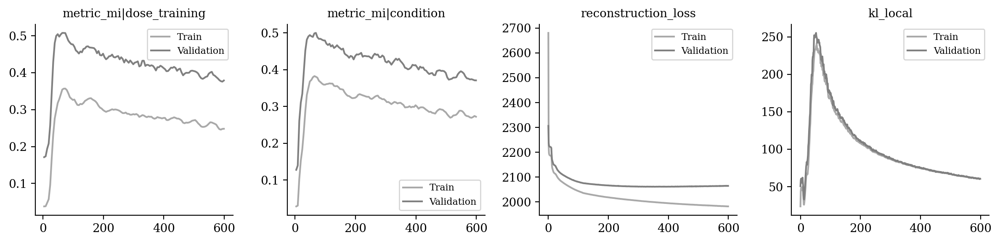

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

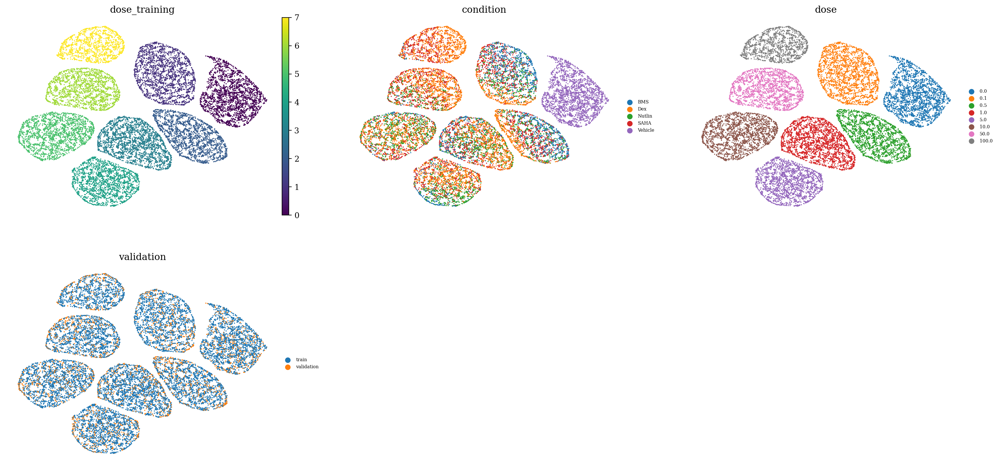

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

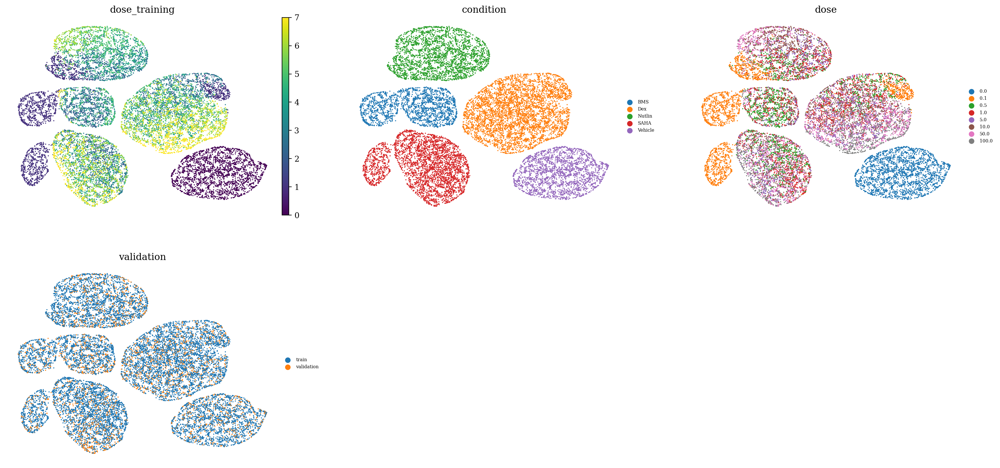

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

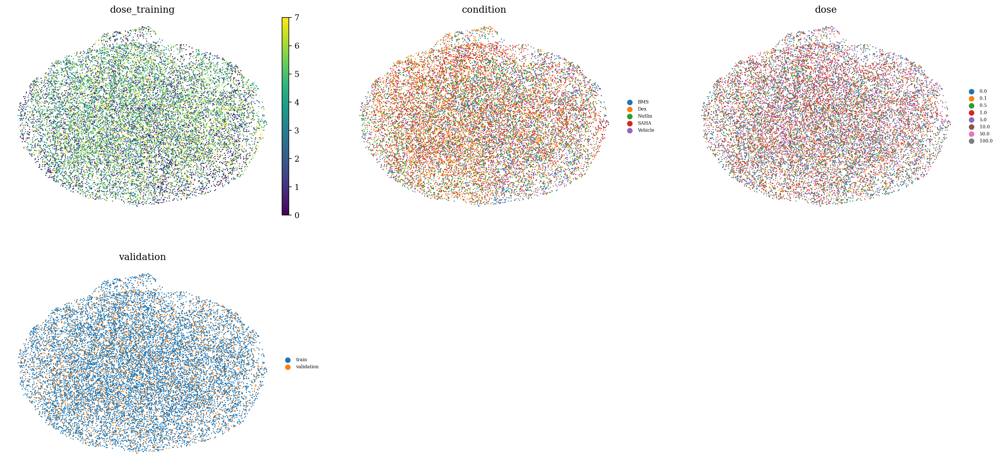

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

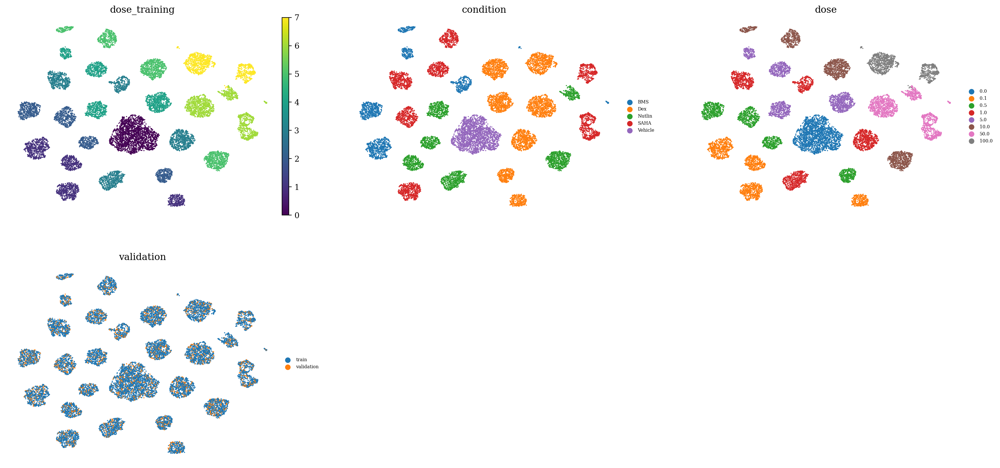

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1